In [1]:
import requests
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import time
import streamlit as st
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import plotly.express as px

### 1. Data Collection

In [3]:
# Function to fetch data from WHO GHO API
def fetch_data_from_gho(api_url):
    response = requests.get(api_url)
    if response.status_code == 200:
        data = response.json()
        return pd.DataFrame(data['value'])
    else:
        print(f"Failed to fetch data from {api_url}. Status code: {response.status_code}")
        return pd.DataFrame()  

# Data Collection URLs 
url_dict = {
    "Life Expectancy": "https://ghoapi.azureedge.net/api/WHOSIS_000001",
    "Infant Mortality": "https://ghoapi.azureedge.net/api/MDG_0000000026",
    "Obesity": "https://ghoapi.azureedge.net/api/NCD_BMI_30A",
    "Hypertension": "https://ghoapi.azureedge.net/api/NCD_HYP_CONTROL_A",
    "Water Access": "https://ghoapi.azureedge.net/api/WSH_WATER_BASIC",
    "Sanitation Access": "https://ghoapi.azureedge.net/api/WSH_SANITATION_SAFELY_MANAGED"
}

# Fetch the raw data for each dataset and inspect each dataset
for name, url in url_dict.items():
    df = fetch_data_from_gho(url)
    print(f"Raw data for {name}:")
    print(df.head(), "\n")

Raw data for Life Expectancy:
     Id  IndicatorCode SpatialDimType SpatialDim TimeDimType  \
0   644  WHOSIS_000001        COUNTRY        SOM        YEAR   
1   785  WHOSIS_000001        COUNTRY        BTN        YEAR   
2  2735  WHOSIS_000001        COUNTRY        BHR        YEAR   
3  5229  WHOSIS_000001        COUNTRY        SAU        YEAR   
4  5457  WHOSIS_000001        COUNTRY        CYP        YEAR   

  ParentLocationCode         ParentLocation Dim1Type  TimeDim      Dim1  ...  \
0                EMR  Eastern Mediterranean      SEX     2008   SEX_MLE  ...   
1               SEAR        South-East Asia      SEX     2002  SEX_BTSX  ...   
2                EMR  Eastern Mediterranean      SEX     2011  SEX_FMLE  ...   
3                EMR  Eastern Mediterranean      SEX     2005  SEX_FMLE  ...   
4                EUR                 Europe      SEX     2003   SEX_MLE  ...   

  DataSourceDim             Value NumericValue       Low      High Comments  \
0          None  48.0 [46

### 2. Data Cleaning and Preparation - Individual Datasets

In [5]:
# Columns to drop for all datasets (excluding 'Country' and 'Continent')
columns_to_drop = [
    'IndicatorCode', 'TimeDimType', 'Value', 'Low', 'High',
    'Id', 'DataSourceDimType', 'DataSourceDim', 'Dim2', 
    'Dim2Type', 'Dim3', 'Dim3Type', 'Comments', 'Date', 
    'TimeDimensionBegin', 'TimeDimensionEnd', 'ParentLocationCode', 
    'Dim1Type', 'Dim1', 'TimeDimensionValue'
]

# Function to clean and prepare the data
def clean_and_prepare_data(df, columns_to_drop):
    # Drop unnecessary columns
    df_cleaned = df.drop(columns=columns_to_drop, errors='ignore').copy()
    
    # Ensure column names are correct
    ###
    df_cleaned.rename(columns={
        'SpatialDim': 'Country',
        'ParentLocation': 'Continent'
    }, inplace=True)
    
    # Drop rows with missing values (if any)
    df_cleaned.dropna(inplace=True)
    
    # Reset the index after dropping rows
    df_cleaned.reset_index(drop=True, inplace=True)
    
    return df_cleaned

In [6]:
# Scaling Data, Cleaning Data and Saving to CSV

# Function to scale NumericValue column using Min-Max Scaling
def min_max_scaling(df, column):
    scaler = MinMaxScaler()
    df[column] = scaler.fit_transform(df[[column]])
    return df

# Cleaned and scaled datasets dictionary
cleaned_datasets = {}

# Fetch, clean, scale, and save datasets
for name, url in url_dict.items():
    df = fetch_data_from_gho(url)
    df_cleaned = clean_and_prepare_data(df, columns_to_drop)
    
    # Scale the NumericValue column
    df_cleaned = min_max_scaling(df_cleaned, 'NumericValue')
    
    # Save the cleaned and scaled dataset to the dictionary
    cleaned_datasets[name] = df_cleaned
    
    # Save the cleaned and scaled dataset to a CSV file
    cleaned_file_path = f"{name.replace(' ', '_').lower()}_cleaned_scaled.csv"
    df_cleaned.to_csv(cleaned_file_path, index=False)
    
    # Inspect the cleaned and scaled data
    print(f"Cleaned and scaled data for {name}:")
    print("Info:")
    df_cleaned.info()
    print("Describe:")
    print(df_cleaned.describe())
    print("Head:")
    print(df_cleaned.head(), "\n")

Cleaned and scaled data for Life Expectancy:
Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12210 entries, 0 to 12209
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   SpatialDimType  12210 non-null  object 
 1   Country         12210 non-null  object 
 2   Continent       12210 non-null  object 
 3   TimeDim         12210 non-null  int64  
 4   NumericValue    12210 non-null  float64
dtypes: float64(1), int64(1), object(3)
memory usage: 477.1+ KB
Describe:
            TimeDim  NumericValue
count  12210.000000  12210.000000
mean    2010.500000      0.661307
std        6.344549      0.175288
min     2000.000000      0.000000
25%     2005.000000      0.543385
50%     2010.500000      0.694772
75%     2016.000000      0.797414
max     2021.000000      1.000000
Head:
  SpatialDimType Country              Continent  TimeDim  NumericValue
0        COUNTRY     SOM  Eastern Mediterranean     2008      0.22529

### 3. Exploratory Data Analysis (EDA)

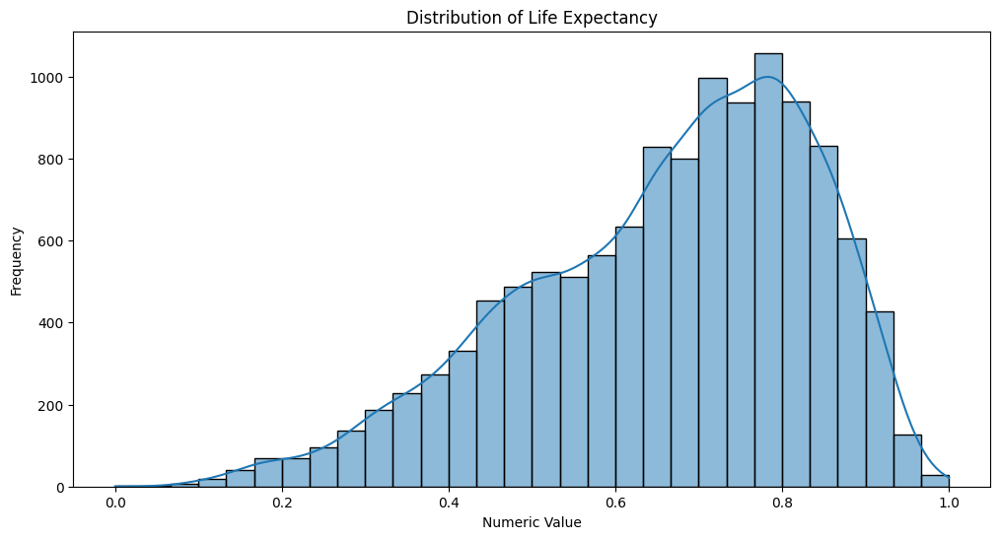

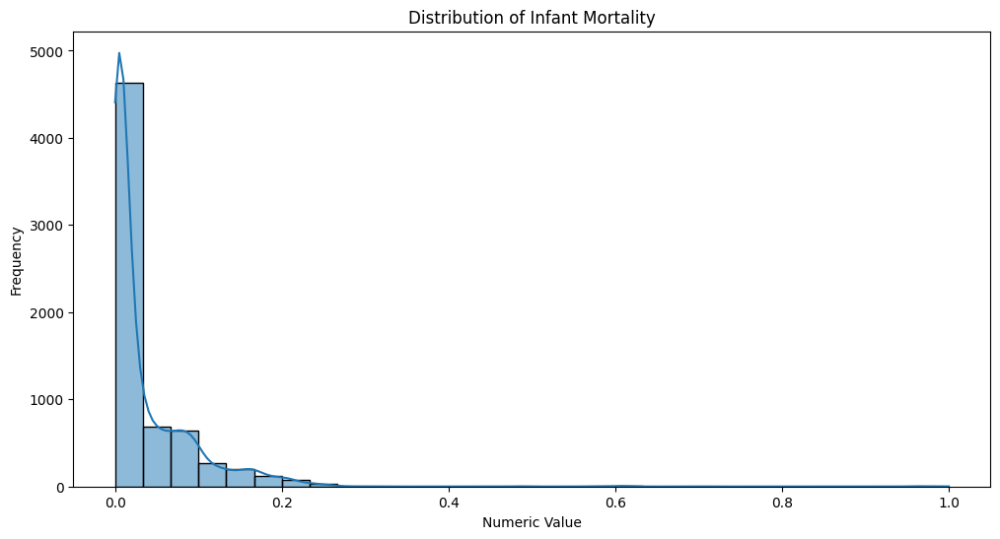

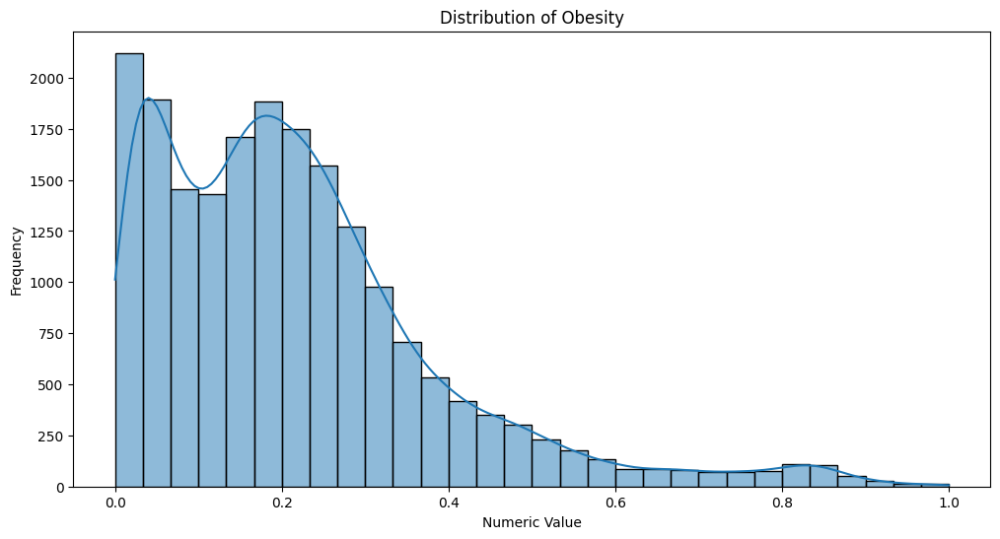

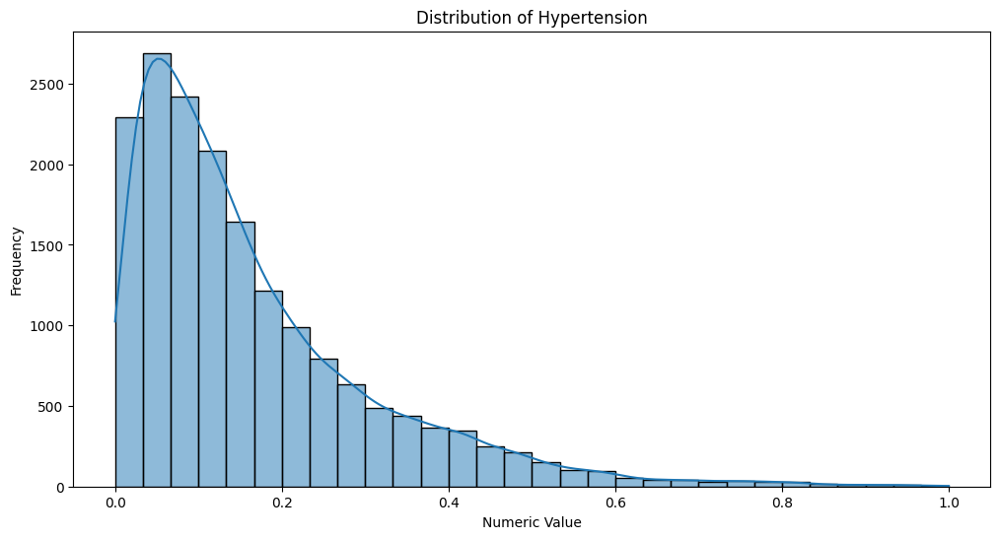

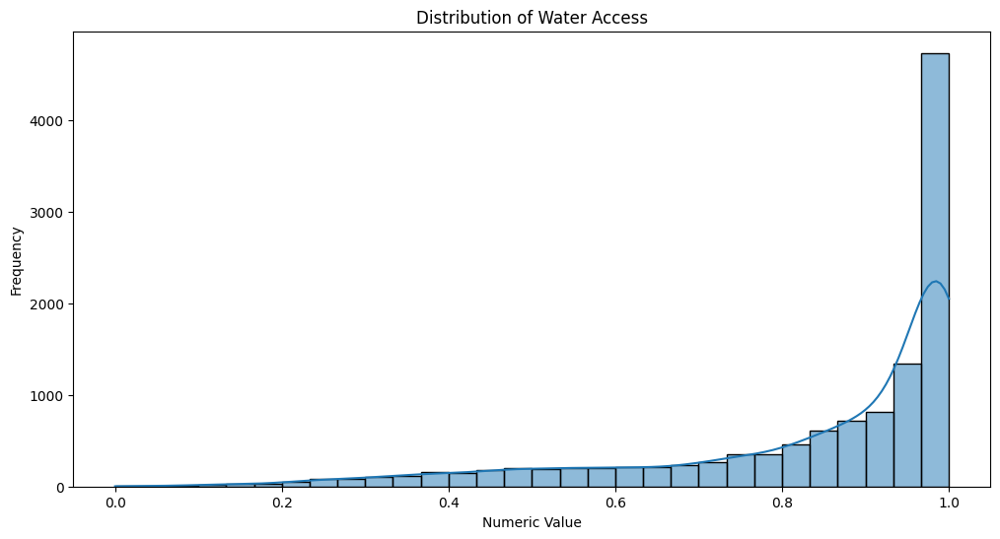

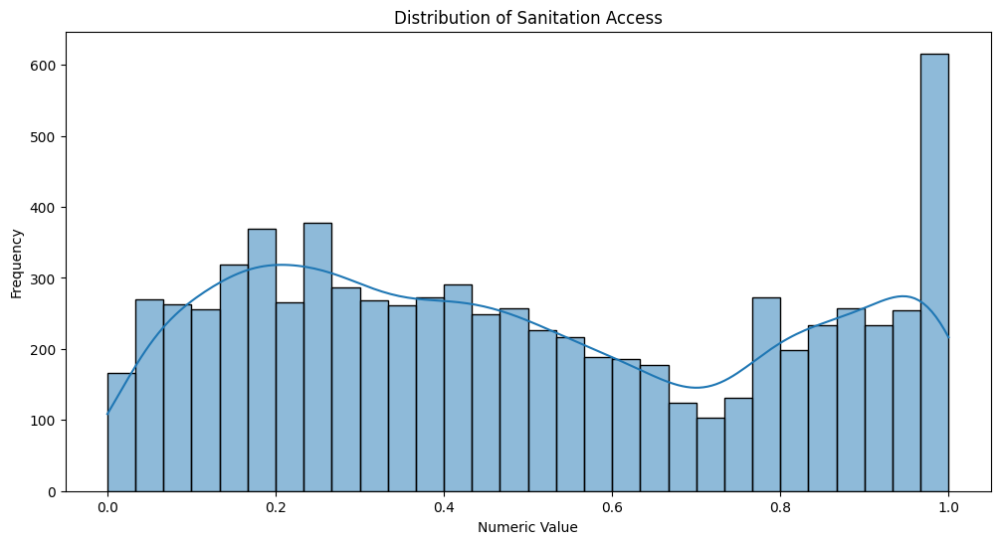

In [8]:
# EDA

def plot_distribution(df, title):
    plt.figure(figsize=(12, 6))
    sns.histplot(df['NumericValue'], kde=True, bins=30)
    plt.title(f'Distribution of {title}')
    plt.xlabel('Numeric Value')
    plt.ylabel('Frequency')
    plt.show()

for name, df in cleaned_datasets.items():
    plot_distribution(df, name)

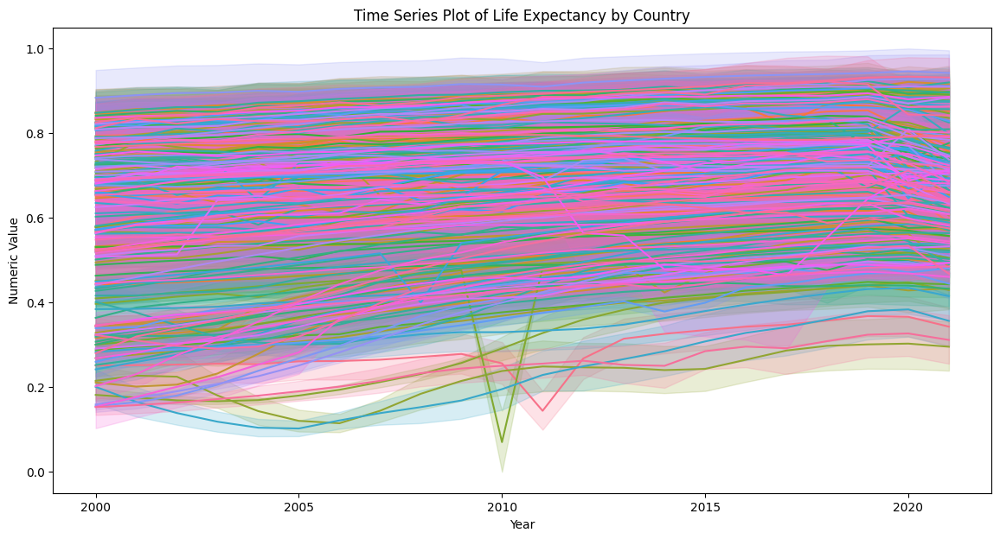

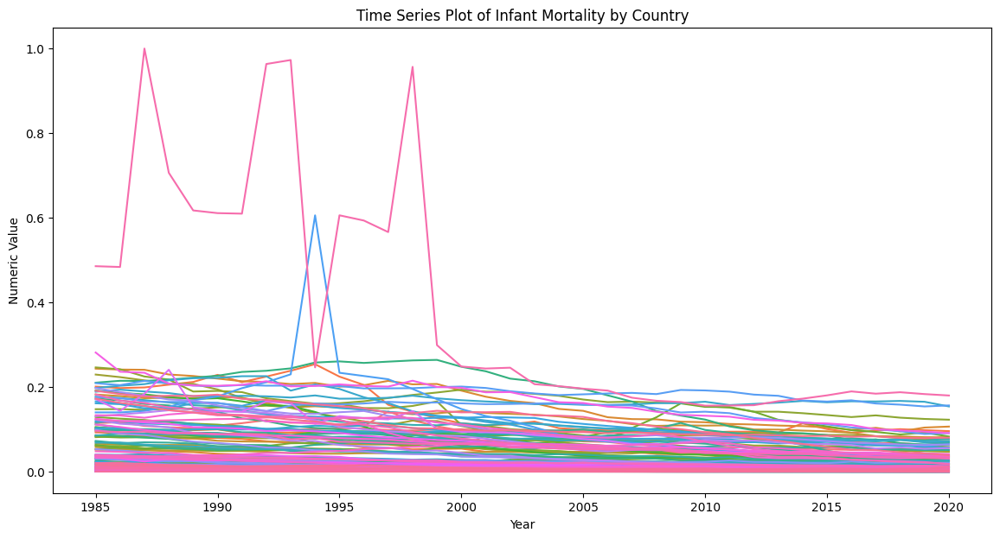

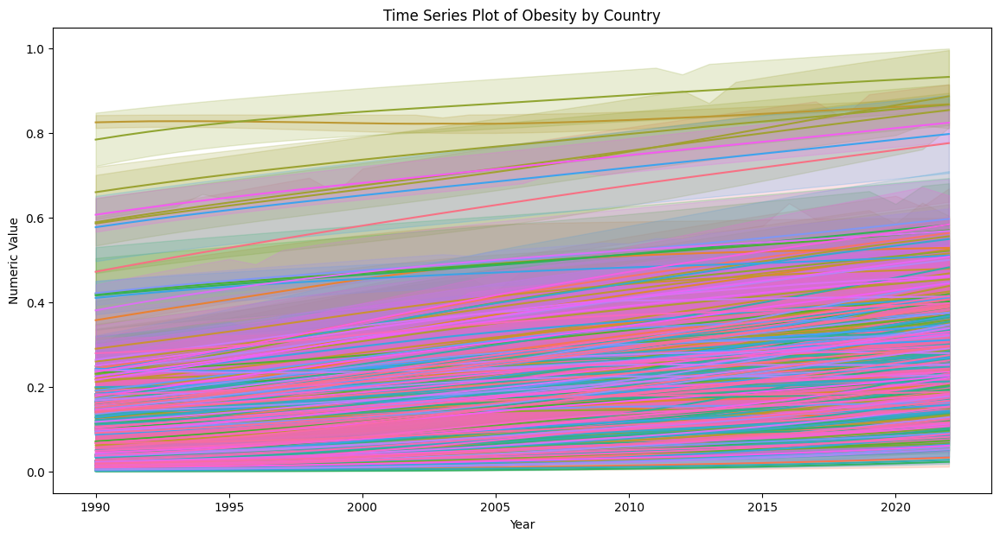

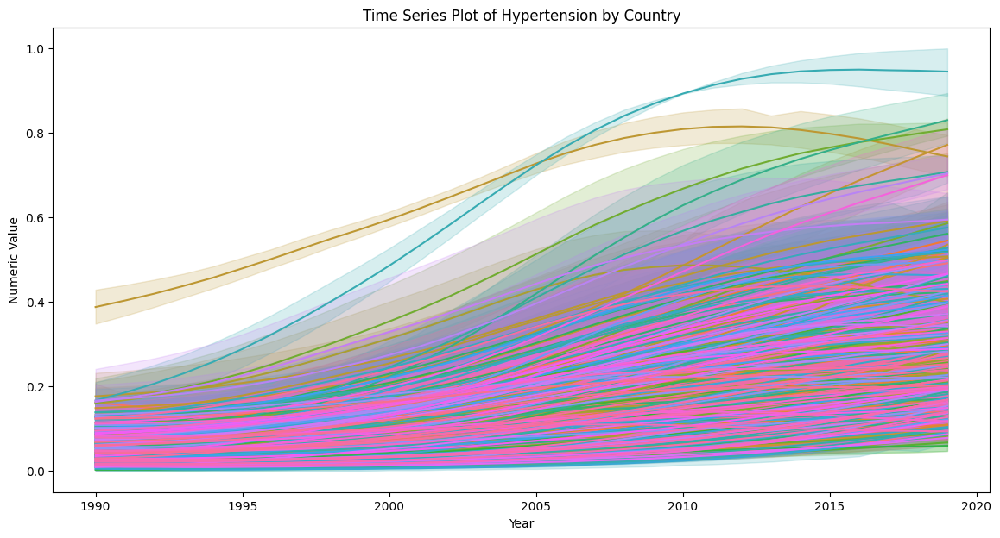

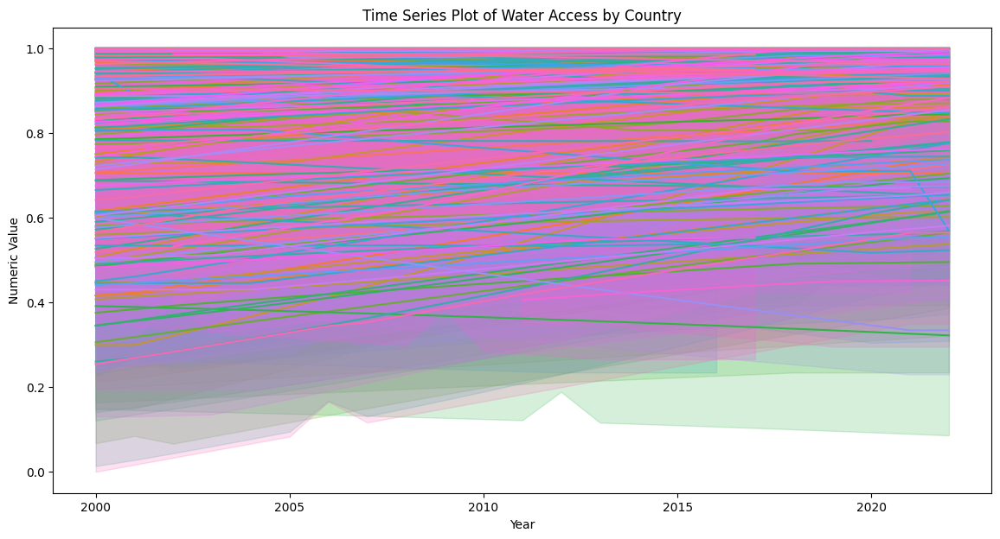

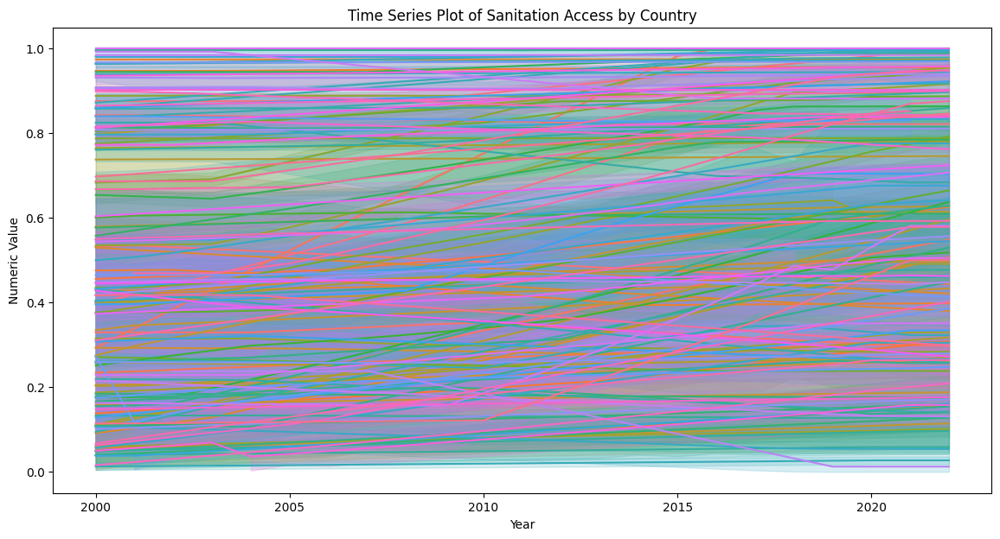

In [9]:
def plot_time_series(df, title):
    plt.figure(figsize=(14, 7))
    sns.lineplot(data=df, x='TimeDim', y='NumericValue', hue='Country', legend=False)
    plt.title(f'Time Series Plot of {title} by Country')
    plt.xlabel('Year')
    plt.ylabel('Numeric Value')
    plt.show()

for name, df in cleaned_datasets.items():
    plot_time_series(df, name)

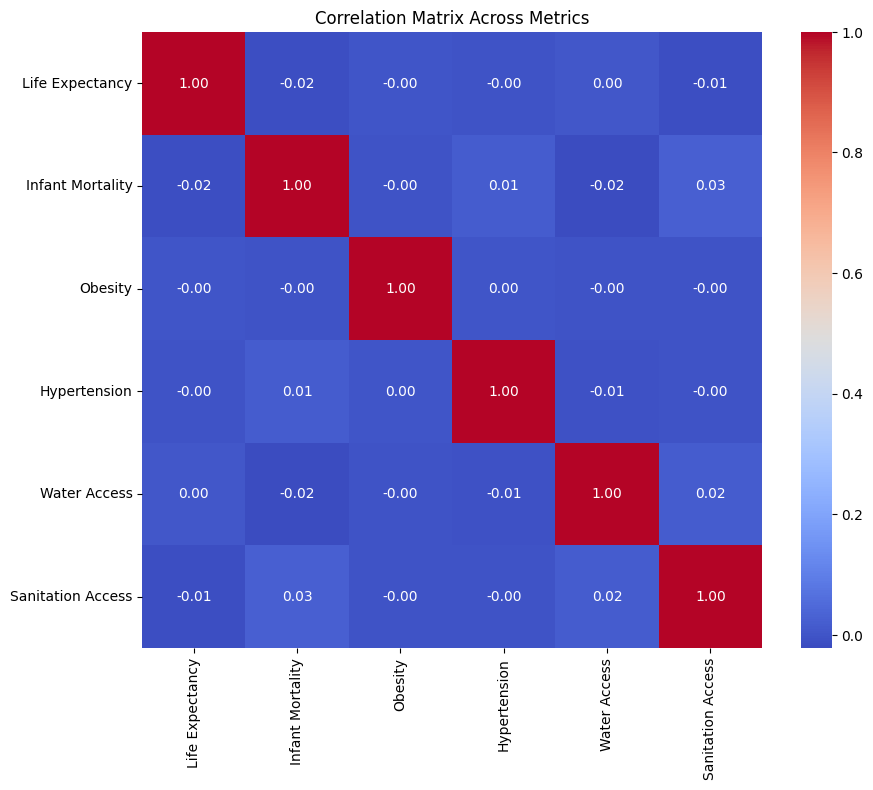

In [10]:
def plot_correlation_matrix(df_dict):
    # Concatenate only the NumericValue columns from each dataset
    combined_df = pd.concat([df['NumericValue'] for df in df_dict.values()], axis=1, keys=df_dict.keys())
    
    # Calculate the correlation matrix
    corr = combined_df.corr()
    
    # Plot the heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('Correlation Matrix Across Metrics')
    plt.show()

plot_correlation_matrix(cleaned_datasets)

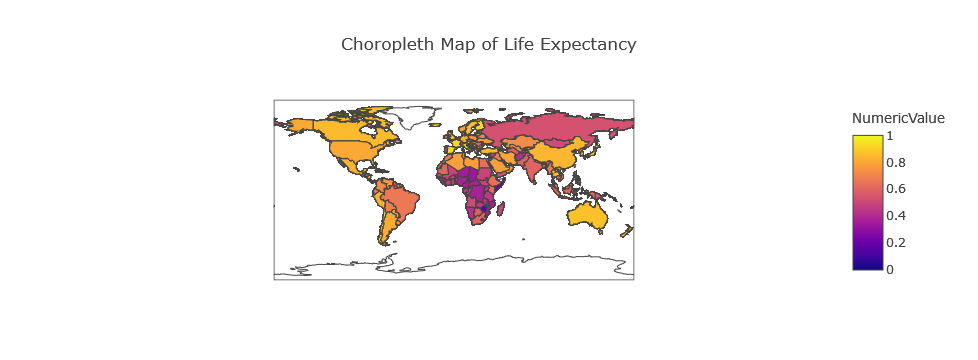

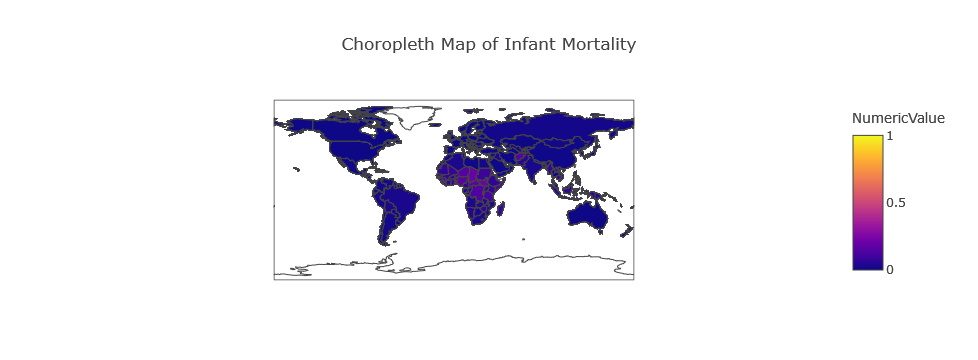

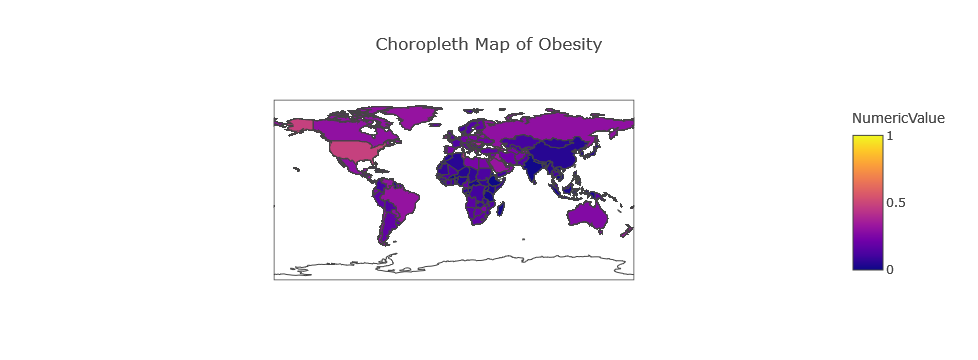

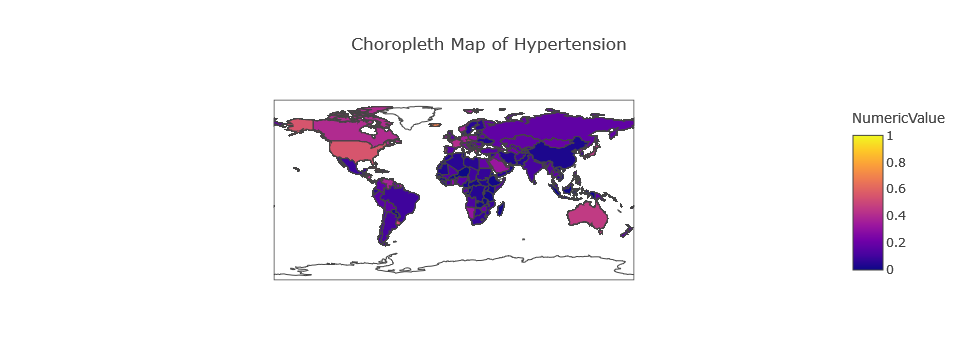

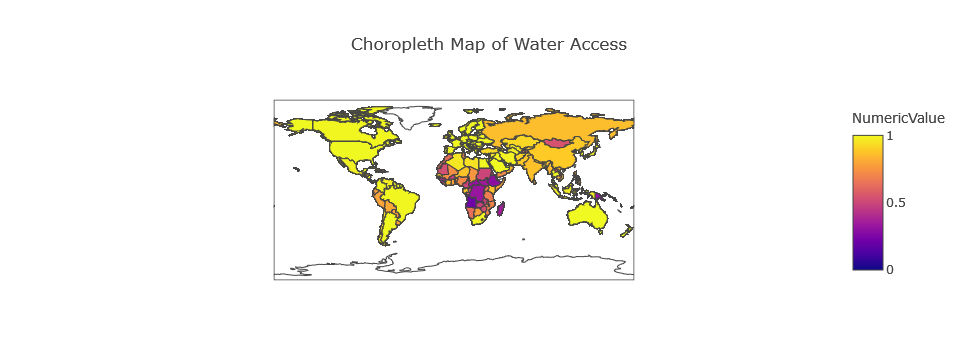

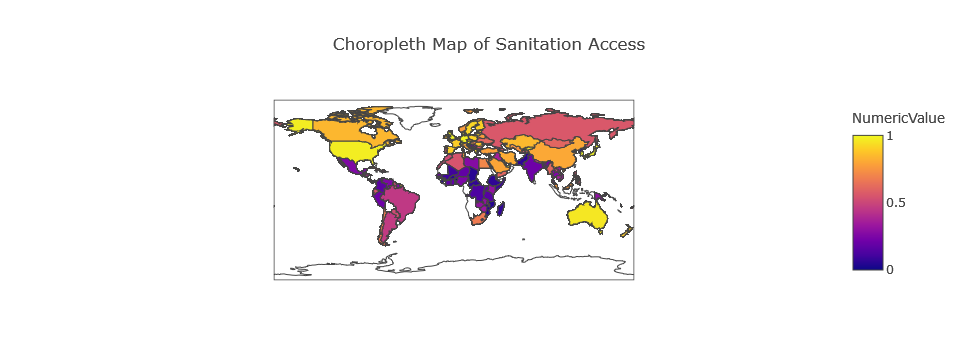

In [11]:
def plot_choropleth(df, title):
    # Ensure no missing data for plotting
    df = df.dropna(subset=['Country', 'NumericValue'])

    fig = px.choropleth(df, 
                        locations="Country", 
                        locationmode="ISO-3",  
                        color="NumericValue", 
                        hover_name="Country",
                        title=f'Choropleth Map of {title}',
                        color_continuous_scale=px.colors.sequential.Plasma)
    fig.show()

# Iterate over each cleaned dataset and plot
for name, df in cleaned_datasets.items():
    plot_choropleth(df, name)

Analyzing dataset: Life Expectancy
Summary Statistics:
            TimeDim  NumericValue
count  12210.000000  12210.000000
mean    2010.500000      0.661307
std        6.344549      0.175288
min     2000.000000      0.000000
25%     2005.000000      0.543385
50%     2010.500000      0.694772
75%     2016.000000      0.797414
max     2021.000000      1.000000 

Total unique countries in Life Expectancy: 185
Countries: SOM, BTN, BHR, SAU, CYP, DNK, PHL, MAR, WSM, JOR, URY, PRI, GHA, TON, TUR, BRA, FJI, NIC, IRQ, BGD, SWE, AUS, ISL, COD, FSM, NGA, KEN, ATG, BWA, TUN, CZE, PNG, FRA, ESP, JAM, SVK, LBR, IRL, SUR, UZB, NZL, GNB, OMN, DJI, ECU, TTO, IND, ALB, LSO, EST, CHL, ZWE, RUS, HTI, BEN, GRC, BFA, KGZ, BIH, MLT, TCD, NLD, ROU, SLB, LBN, HRV, LTU, PAK, KIR, GRD, DZA, ITA, MNE, DOM, SSD, MDV, COG, SEN, IRN, ERI, ISR, LAO, COM, CHN, VEN, CMR, TZA, AGO, IDN, GAB, CHE, POL, ARG, ZAF, BHS, MRT, BOL, PRY, GBR, ARE, CUB, AUT, MYS, PRT, PER, THA, GEO, TKM, LKA, MDG, UKR, TGO, VUT, SWZ, BLR, MOZ,

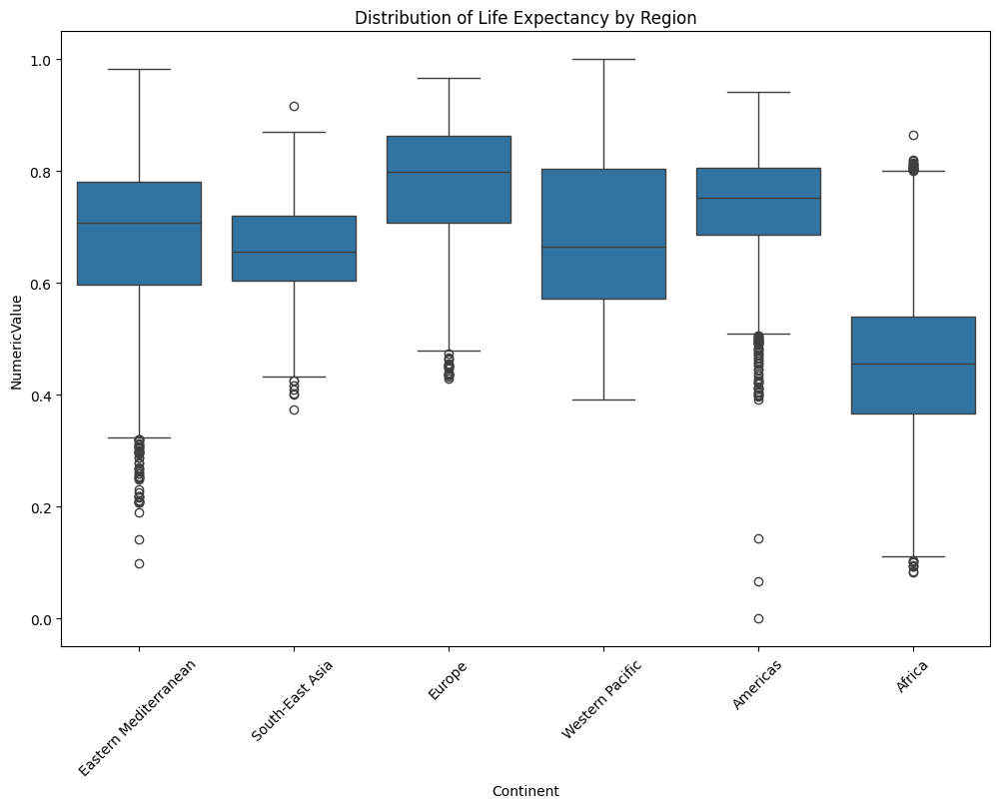

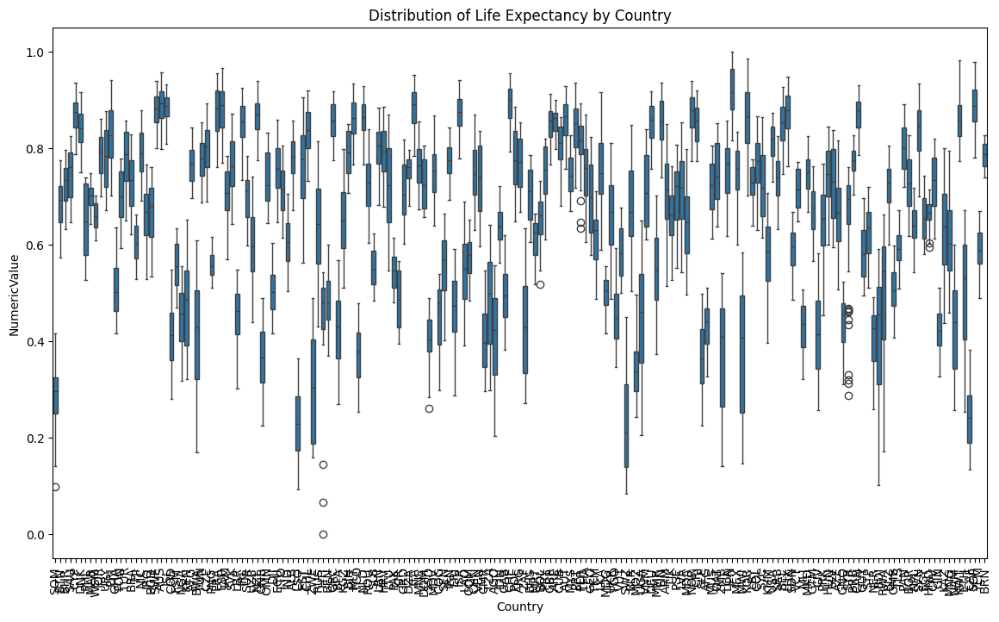

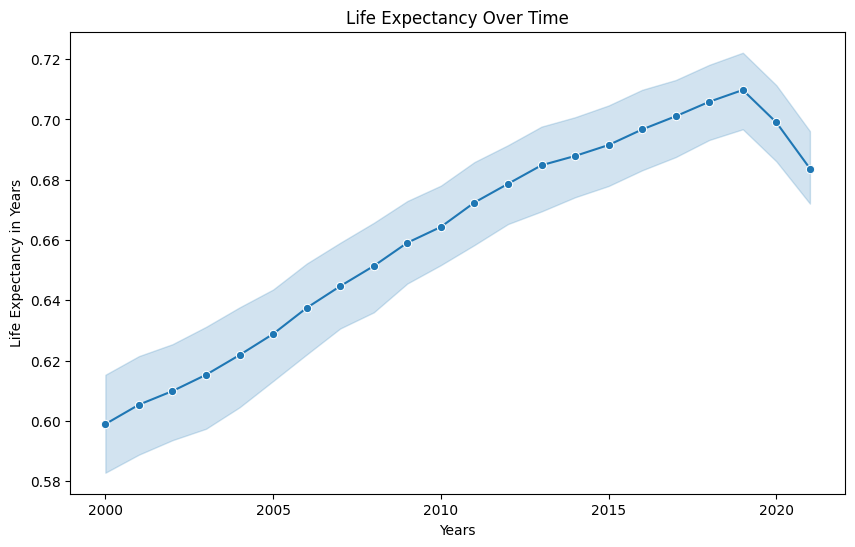


Exploring Infant Mortality dataset:


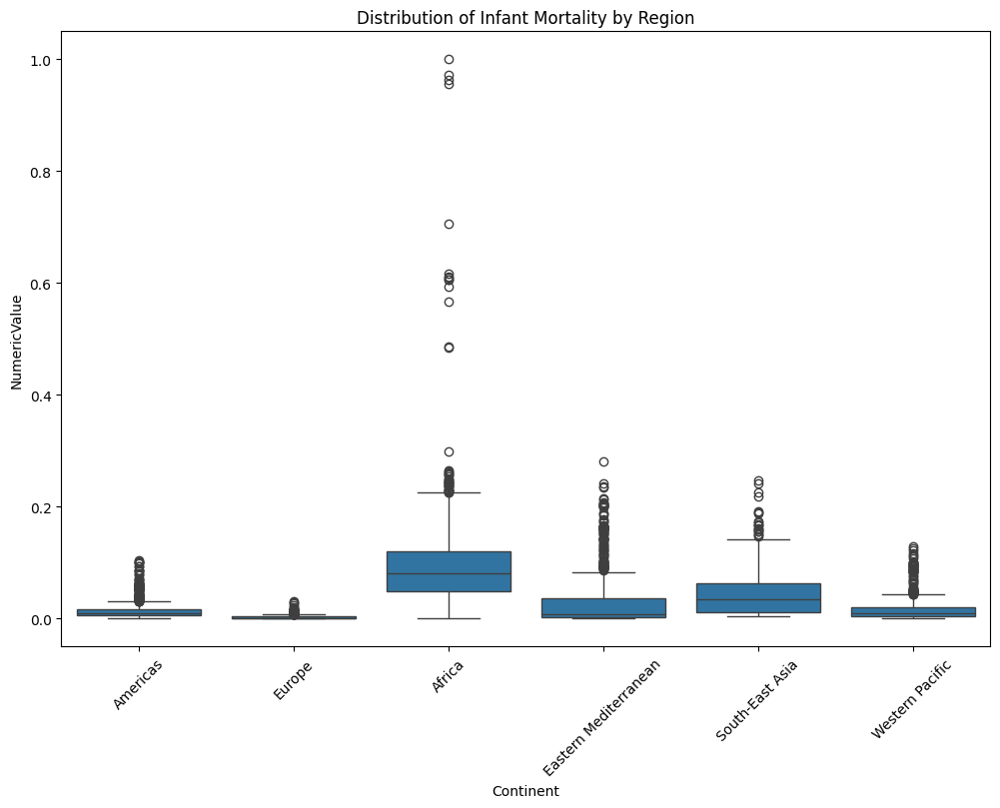

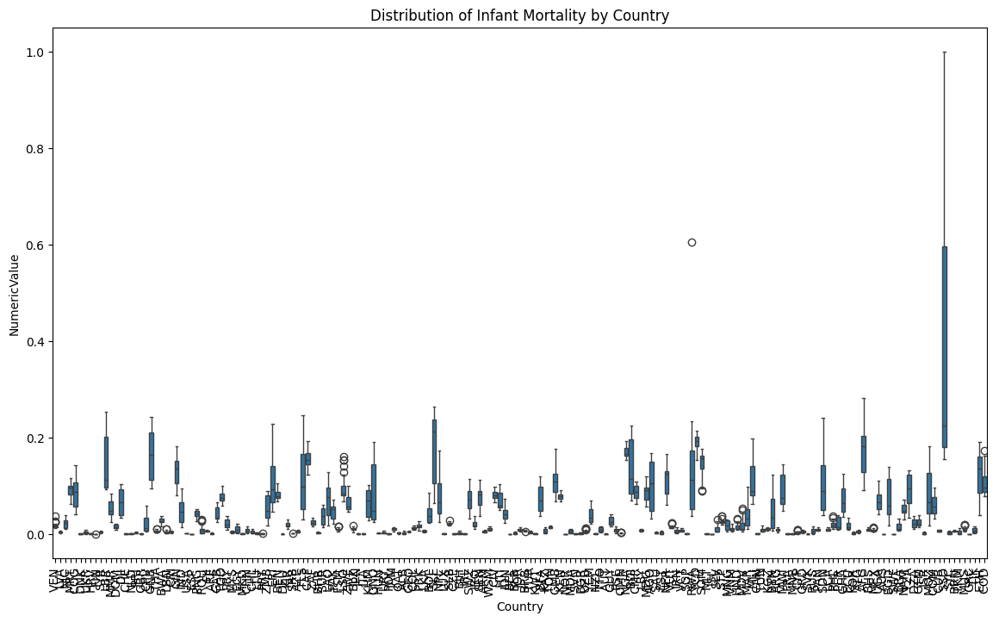

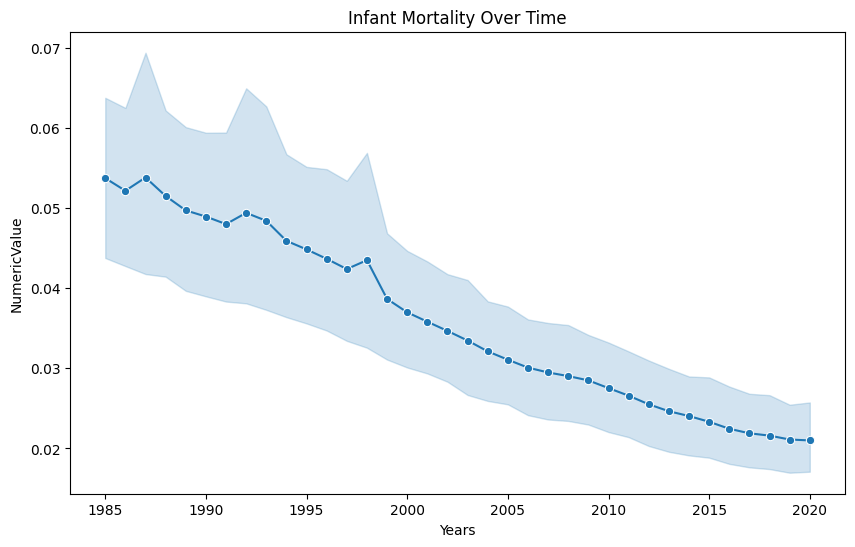


Exploring Obesity dataset:


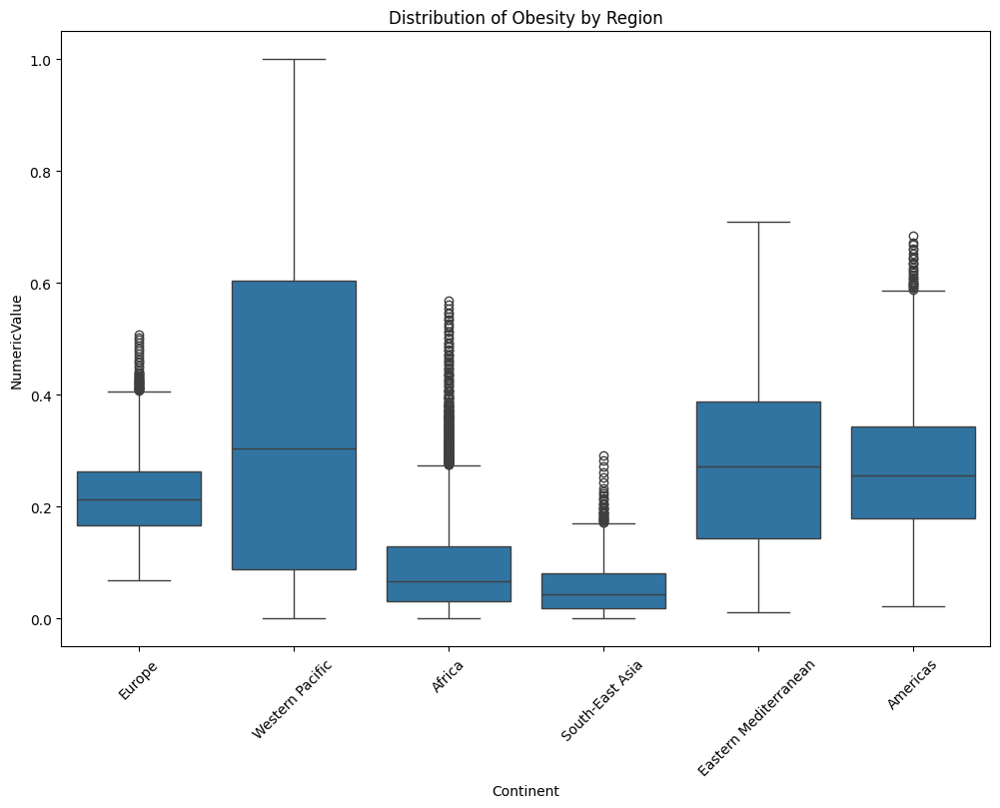

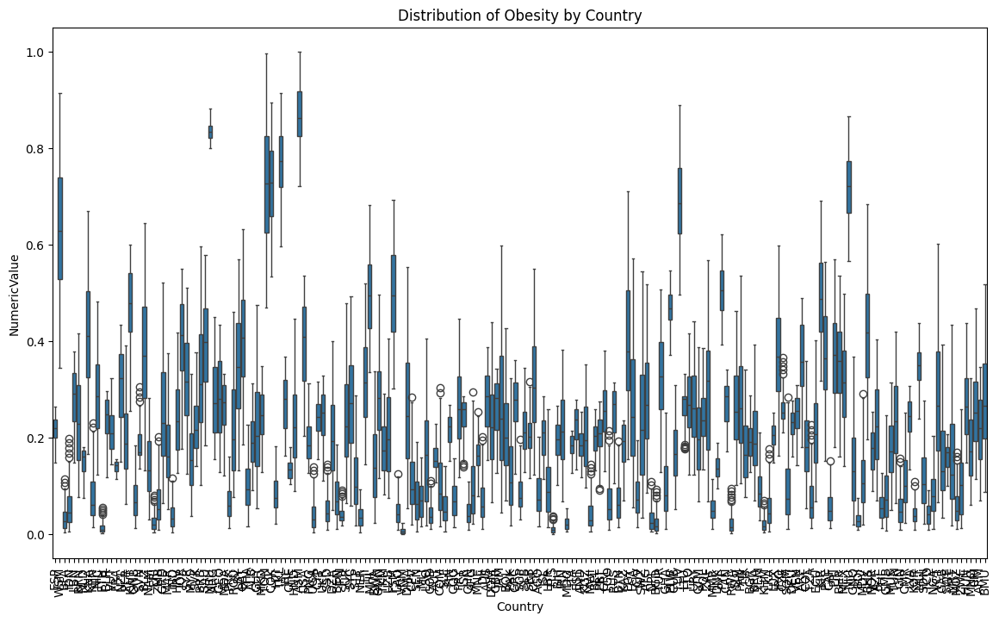

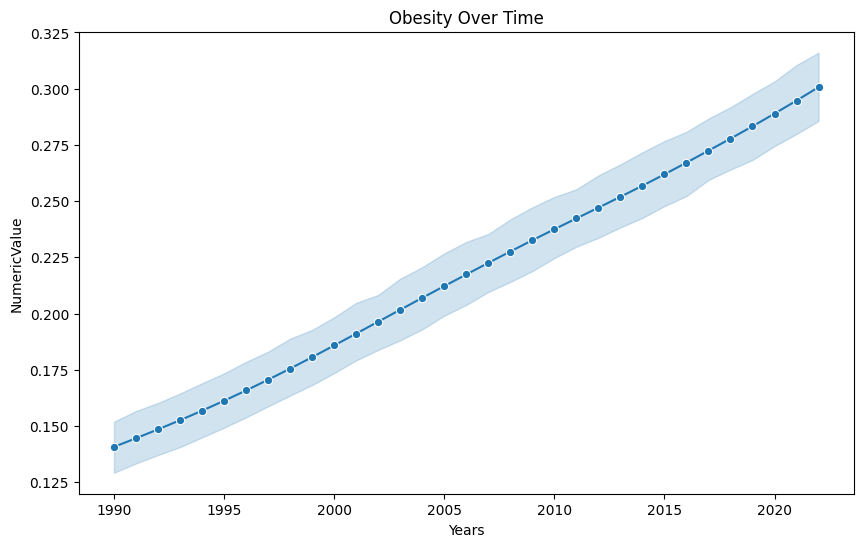


Exploring Hypertension dataset:


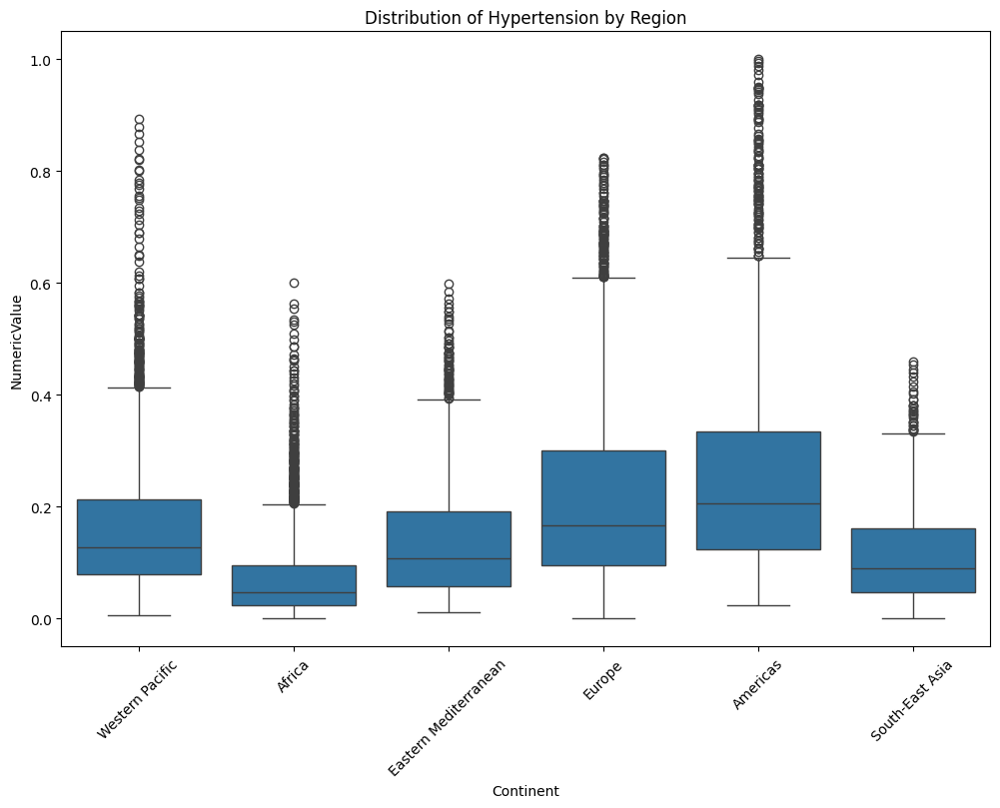

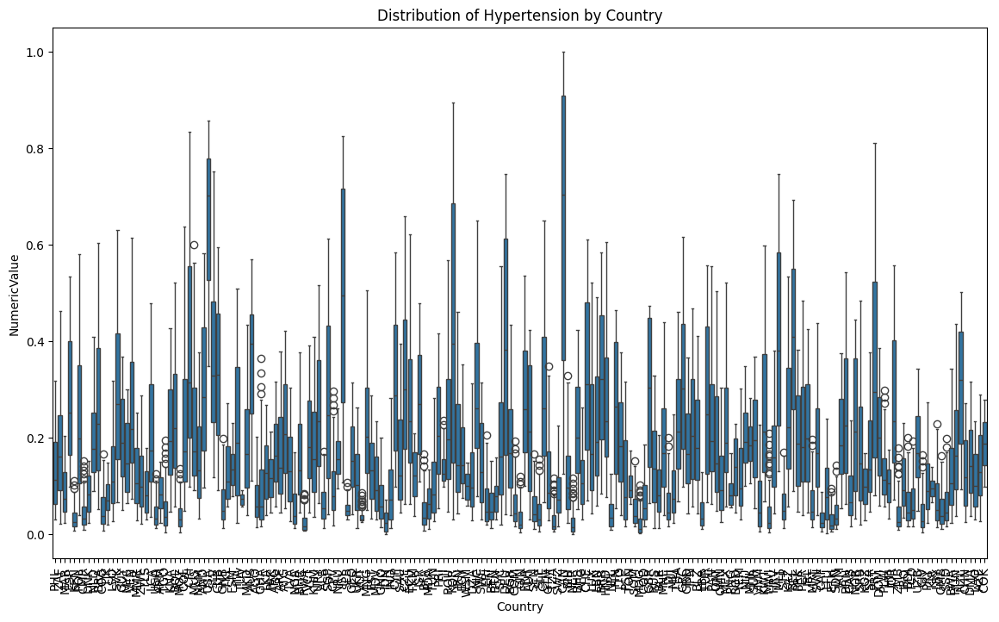

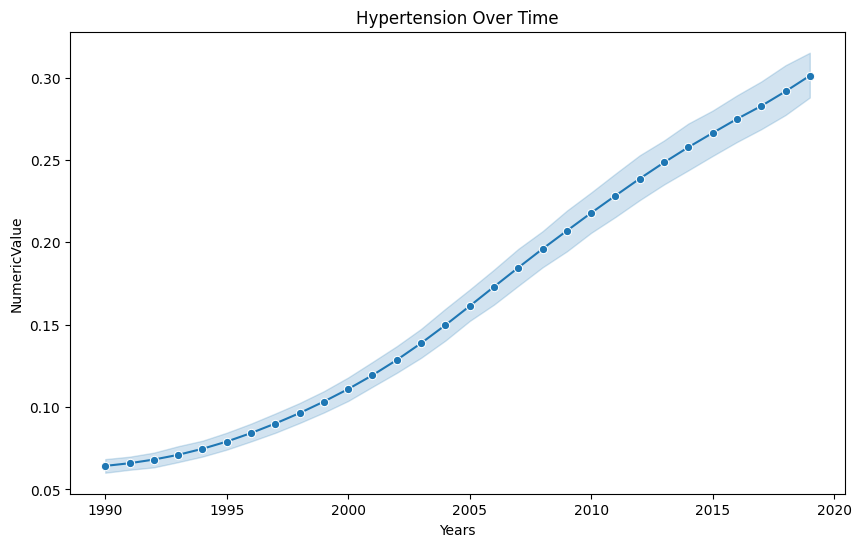


Exploring Water Access dataset:


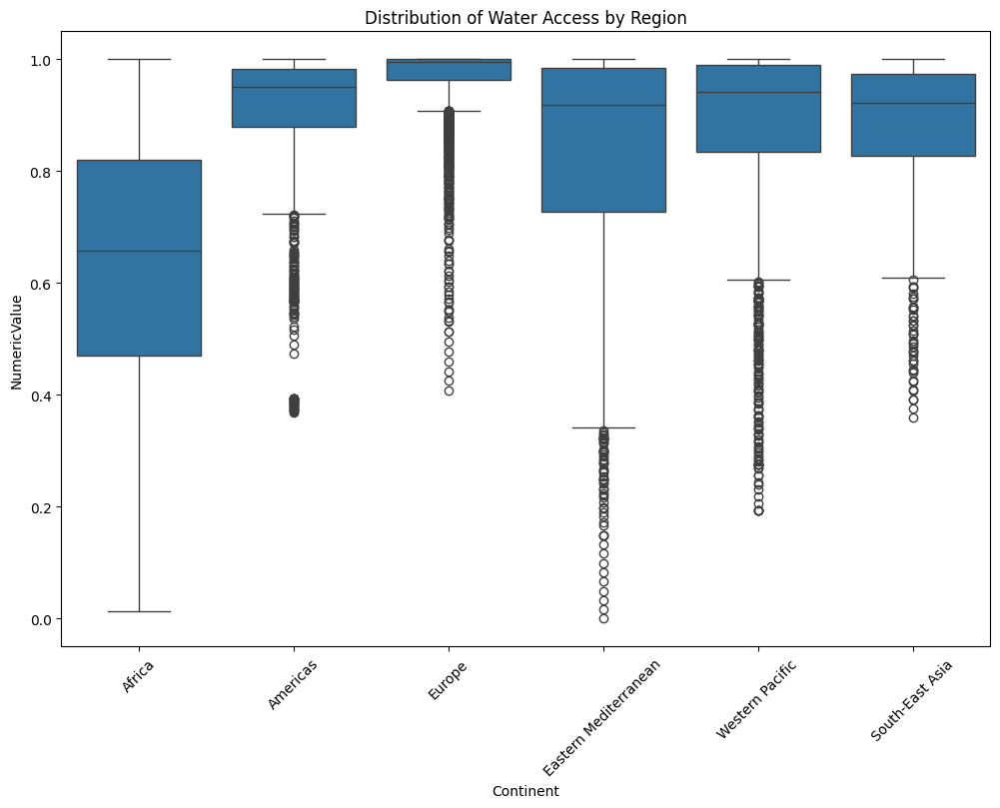

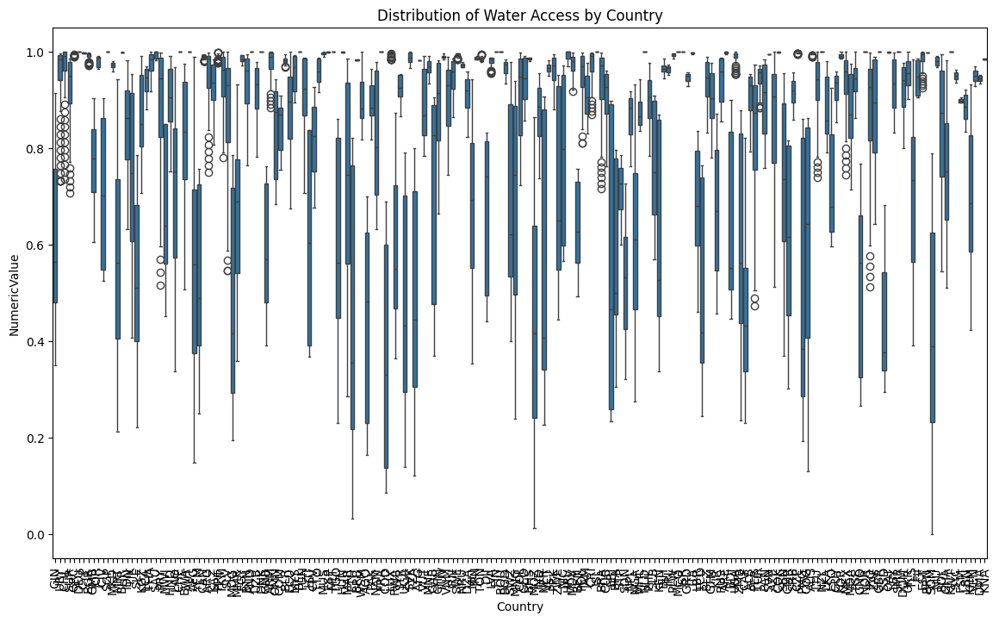

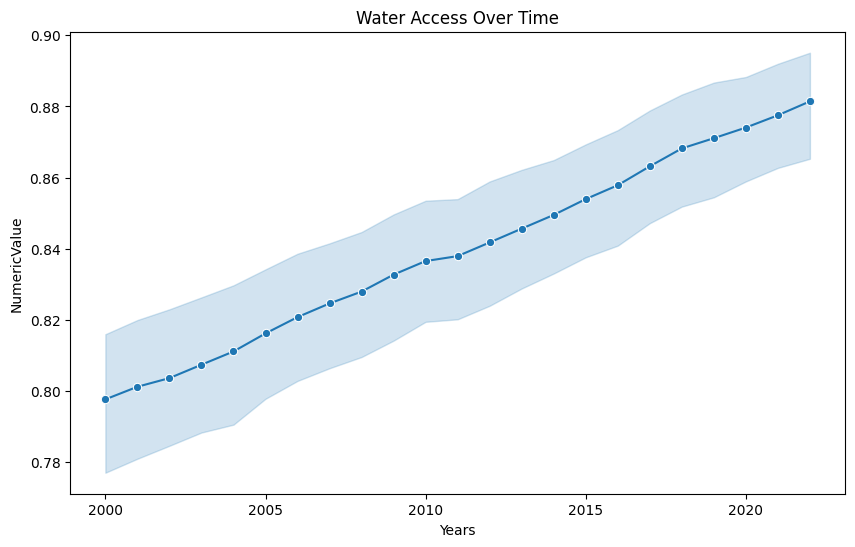


Exploring Sanitation Access dataset:


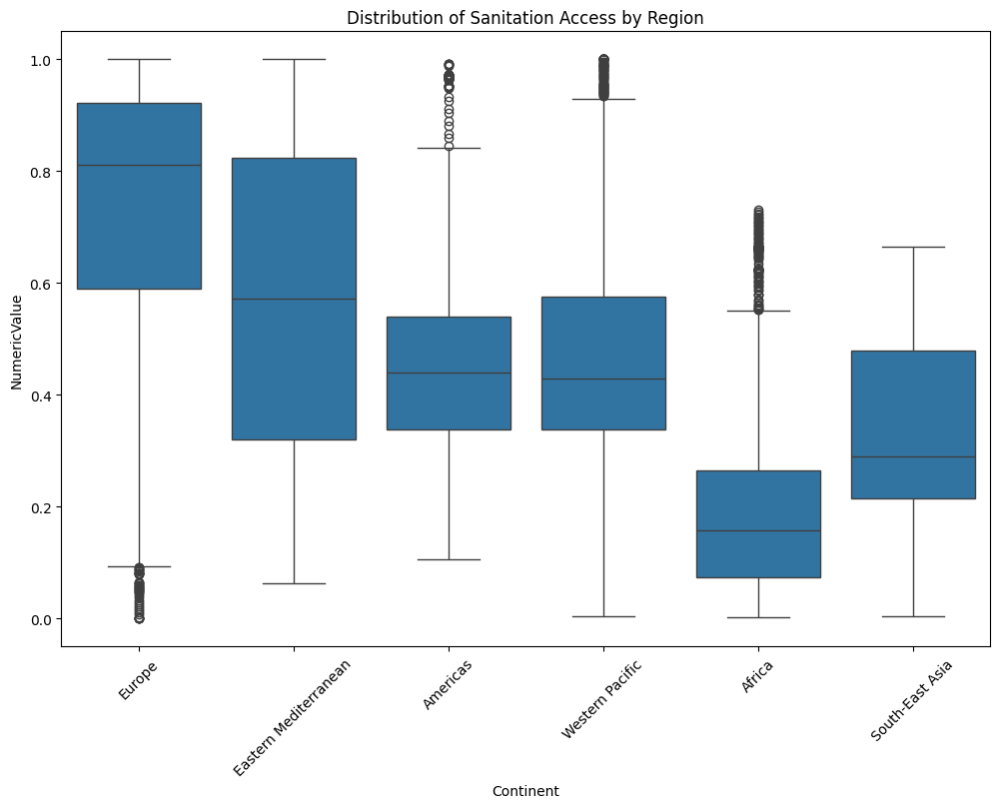

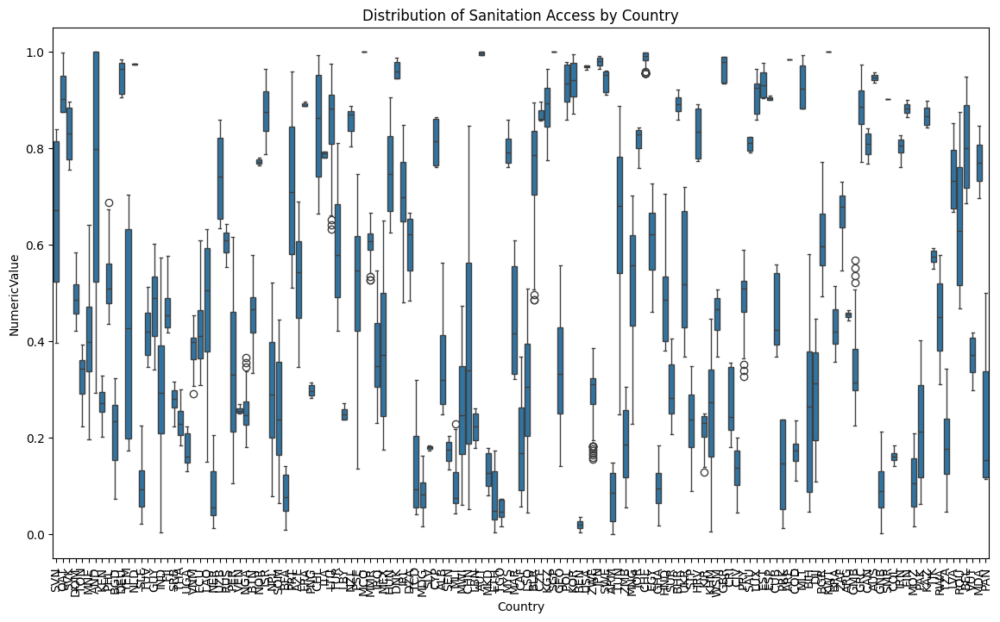

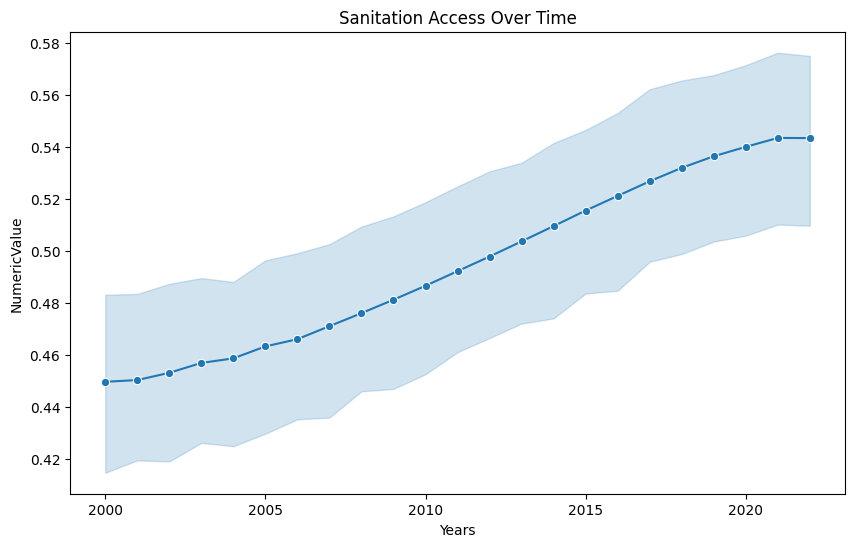

In [12]:
# Function to analyze the datasets
def analyze_datasets(datasets):
    for name, df in datasets.items():
        print(f"Analyzing dataset: {name}")
        
        # Summary statistics
        print("Summary Statistics:")
        print(df.describe(), "\n")  # Extended to include all numeric columns
        
        # Find unique countries
        unique_countries = df['Country'].unique()
        total_countries = len(unique_countries)
        
        # Find unique continents/regions
        unique_continents = df['Continent'].unique()
        total_continents = len(unique_continents)
        
        # Display results
        print(f"Total unique countries in {name}: {total_countries}")
        print(f"Countries: {', '.join(unique_countries)}\n")
        print(f"Total unique continents/regions in {name}: {total_continents}")
        print(f"Continents/Regions: {', '.join(unique_continents)}\n")
        print("---\n")

# Function to plot the distribution of NumericValue across different Regions (Continent)
def plot_distribution_by_region(df, title, save=False, **kwargs):
    plt.figure(figsize=(12, 8))
    sns.boxplot(x='Continent', y='NumericValue', data=df, **kwargs)
    plt.xticks(rotation=45)
    plt.title(f'Distribution of {title} by Region')
    if save:
        plt.savefig(f"{title}_by_region.png", bbox_inches='tight')
    else:
        plt.show()

# Function to plot the distribution of NumericValue across different Countries
def plot_distribution_by_country(df, title, save=False, **kwargs):
    plt.figure(figsize=(14, 8))
    sns.boxplot(x='Country', y='NumericValue', data=df, **kwargs)
    plt.xticks(rotation=90)
    plt.title(f'Distribution of {title} by Country')
    if save:
        plt.savefig(f"{title}_by_country.png", bbox_inches='tight')
    else:
        plt.show()

# Function to plot the distribution of NumericValue over Time (years)
def plot_distribution_over_time(df, title, ylabel, save=False, **kwargs):
    plt.figure(figsize=(10, 6))
    sns.lineplot(x='TimeDim', y='NumericValue', data=df, marker='o', **kwargs)
    plt.title(f'{title} Over Time')
    plt.xlabel('Years')
    plt.ylabel(ylabel)
    if save:
        plt.savefig(f"{title}_over_time.png", bbox_inches='tight')
    else:
        plt.show()

# Call the function to analyze the datasets
analyze_datasets(cleaned_datasets)

# Perform EDA for each dataset and visualize the data
for name, df in cleaned_datasets.items():
    print(f"\nExploring {name} dataset:")
    
    # Plot distribution by region
    plot_distribution_by_region(df, title=name)
    
    # Plot distribution by country
    plot_distribution_by_country(df, title=name)
    
    # Plot distribution over time
    ylabel = f'{name} in Years' if 'Life Expectancy' in name else 'NumericValue'
    plot_distribution_over_time(df, title=name, ylabel=ylabel)

### 4. Feature Engineering

In [14]:
# Feature Engineering

def add_change_over_time(df, column):
    # Ensure the data is sorted by country and year
    df = df.sort_values(by=['Country', 'TimeDim'])
    
    # Calculate the change in the specified column
    df['Change_' + column] = df.groupby('Country')[column].diff().fillna(0)
    
    return df

# Apply the change over time feature to each dataset
for name, df in cleaned_datasets.items():
    cleaned_datasets[name] = add_change_over_time(df, 'NumericValue')
    print(f"Feature 'Change_{name}' added to {name} dataset.")

Feature 'Change_Life Expectancy' added to Life Expectancy dataset.
Feature 'Change_Infant Mortality' added to Infant Mortality dataset.
Feature 'Change_Obesity' added to Obesity dataset.
Feature 'Change_Hypertension' added to Hypertension dataset.
Feature 'Change_Water Access' added to Water Access dataset.
Feature 'Change_Sanitation Access' added to Sanitation Access dataset.


In [15]:
def categorize_life_expectancy(df):
    bins = [0, 0.6, 0.8, 1.0]
    labels = ['Low', 'Medium', 'High']
    df['LifeExpectancyCategory'] = pd.cut(df['NumericValue'], bins=bins, labels=labels)
    return df

# Apply this only to the Life Expectancy dataset
if 'Life Expectancy' in cleaned_datasets:
    cleaned_datasets['Life Expectancy'] = categorize_life_expectancy(cleaned_datasets['Life Expectancy'])
    print("Feature 'LifeExpectancyCategory' added to Life Expectancy dataset.")

Feature 'LifeExpectancyCategory' added to Life Expectancy dataset.


In [16]:
def add_interaction_features(df, interaction_terms):
    for term1, term2 in interaction_terms:
        interaction_feature_name = f'{term1}_x_{term2}'
        df[interaction_feature_name] = df[term1] * df[term2]
    return df

# NumericValue is the feature to interact
interaction_terms = [('NumericValue', 'Change_NumericValue')] 

# Apply interaction features to each dataset
for name, df in cleaned_datasets.items():
    cleaned_datasets[name] = add_interaction_features(df, interaction_terms)
    print(f"Interaction features added to {name} dataset.")

Interaction features added to Life Expectancy dataset.
Interaction features added to Infant Mortality dataset.
Interaction features added to Obesity dataset.
Interaction features added to Hypertension dataset.
Interaction features added to Water Access dataset.
Interaction features added to Sanitation Access dataset.


In [17]:
# Inspect the new features by checking summary statistics
for name, df in cleaned_datasets.items():
    print(f"\nSummary statistics for new features in {name} dataset:")
    print(df.describe(), "\n")


Summary statistics for new features in Life Expectancy dataset:
            TimeDim  NumericValue  Change_NumericValue  \
count  12210.000000  12210.000000         12210.000000   
mean    2010.500000      0.661307             0.001301   
std        6.344549      0.175288             0.071161   
min     2000.000000      0.000000            -0.352156   
25%     2005.000000      0.543385            -0.049286   
50%     2010.500000      0.694772             0.003804   
75%     2016.000000      0.797414             0.051598   
max     2021.000000      1.000000             0.482661   

       NumericValue_x_Change_NumericValue  
count                        12210.000000  
mean                             0.003236  
std                              0.049681  
min                             -0.140297  
25%                             -0.031825  
50%                              0.002358  
75%                              0.036364  
max                              0.241965   


Summary stati

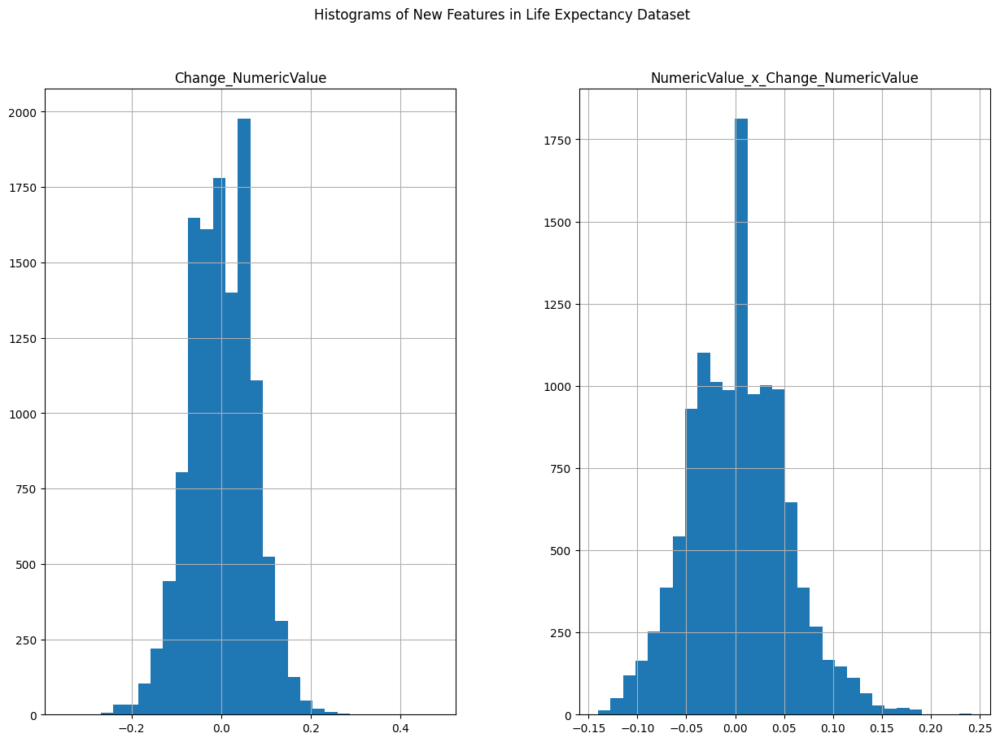

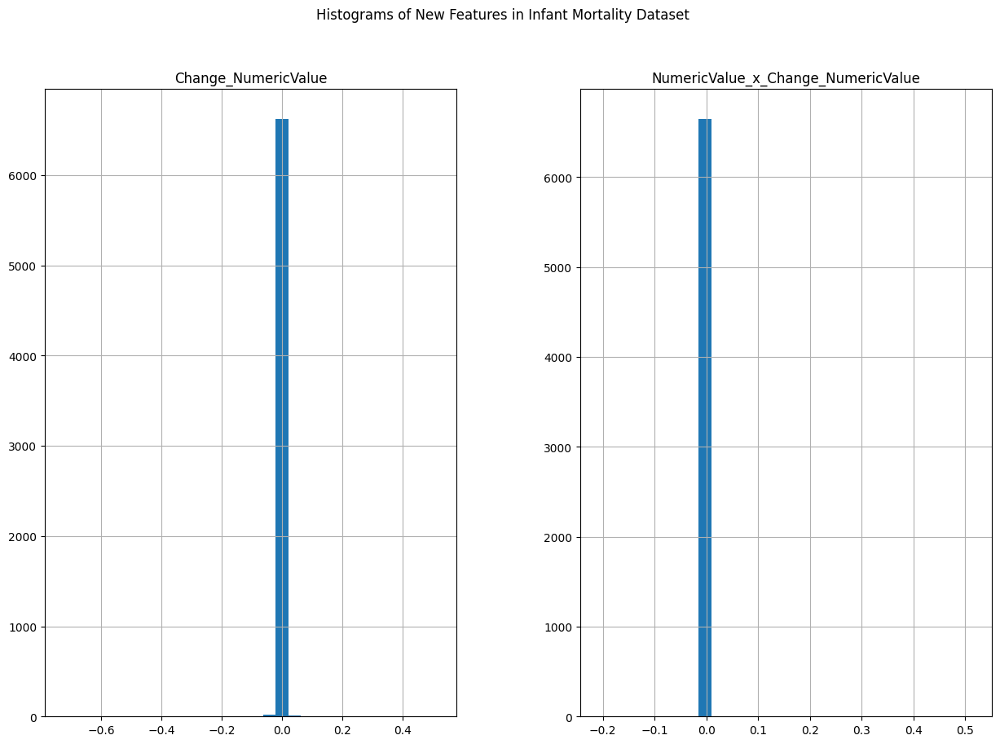

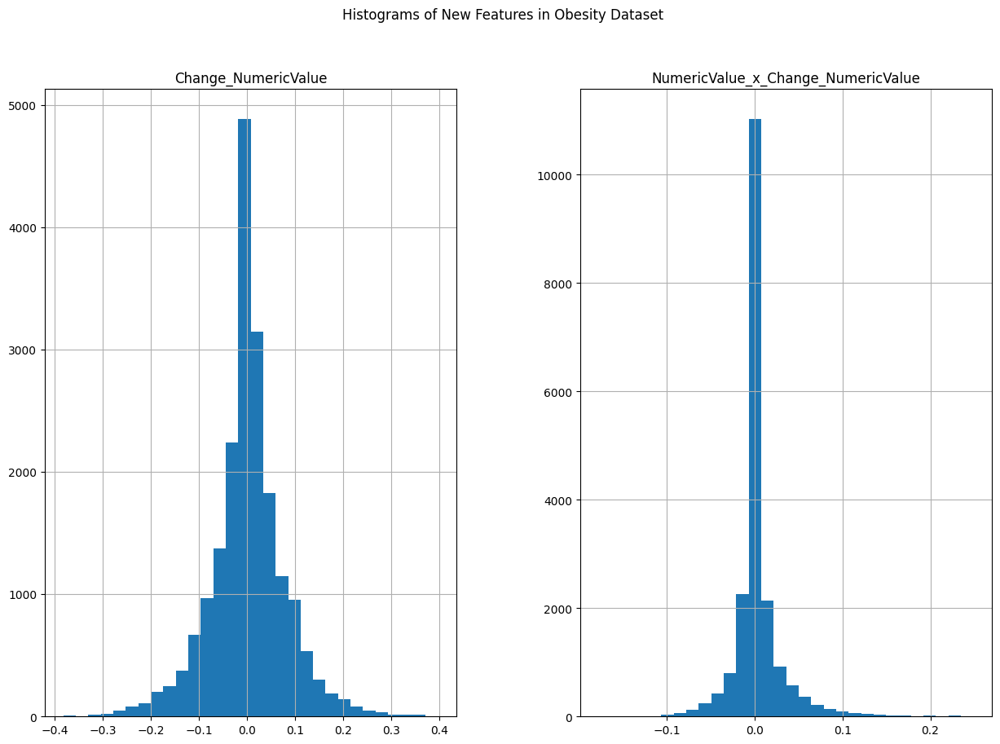

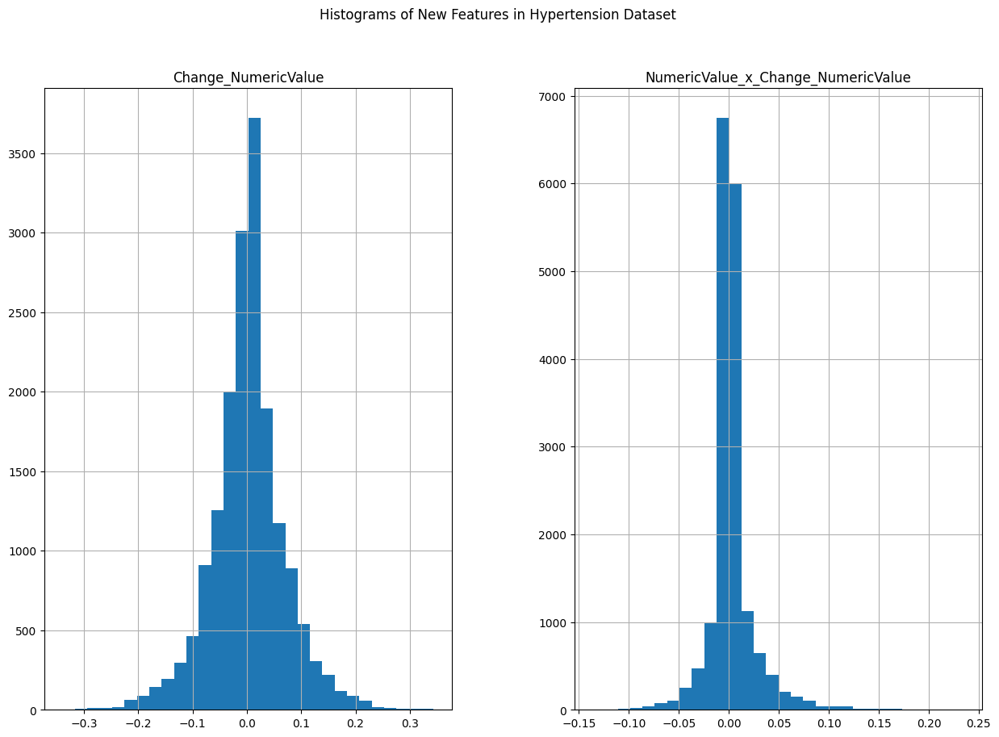

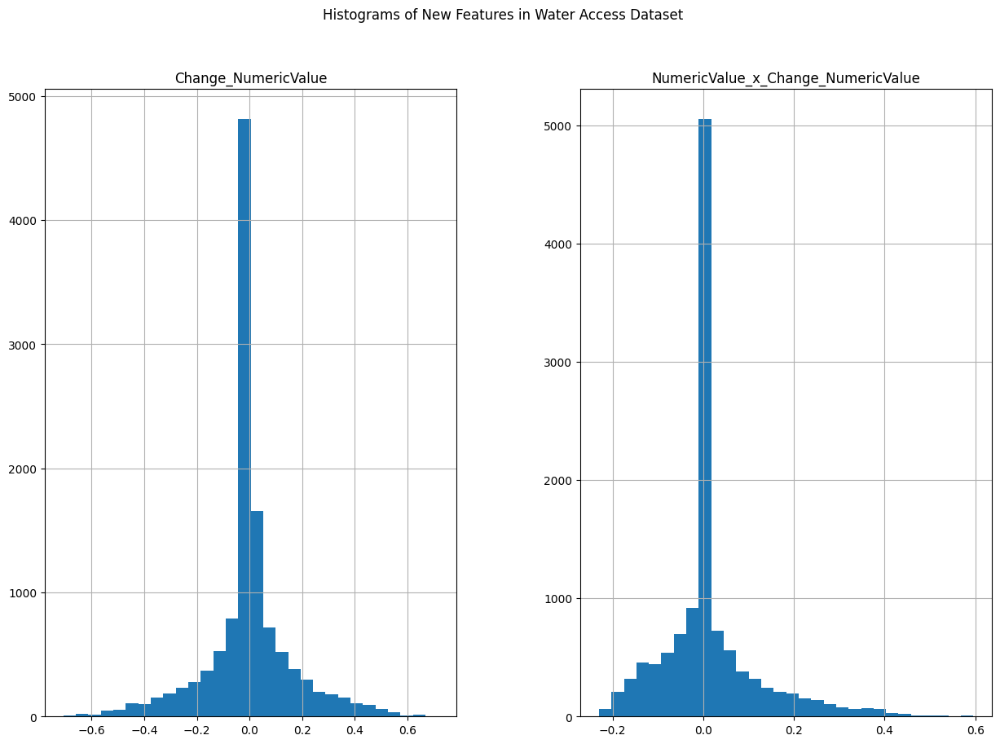

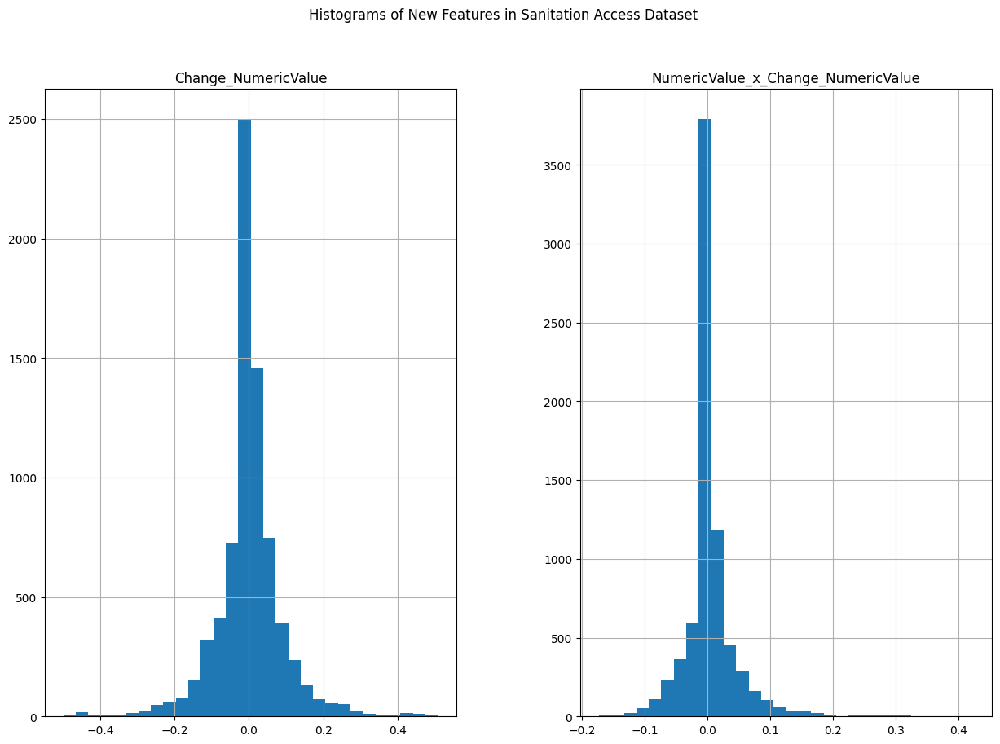

In [18]:
# Function to plot histograms of the new features
def plot_new_features_histograms(df, title):
    new_features = [col for col in df.columns if 'Change' in col or '_x_' in col or 'Category' in col]
    df[new_features].hist(figsize=(15, 10), bins=30)
    plt.suptitle(f'Histograms of New Features in {title} Dataset')
    plt.show()

# Apply to all datasets
for name, df in cleaned_datasets.items():
    plot_new_features_histograms(df, title=name)

In [19]:
# Scaling new features

# Function to rescale new features
def rescale_new_features(df, new_feature_columns):
    # Filter out non-numeric columns
    numeric_features = df[new_feature_columns].select_dtypes(include=[np.number])
    
    # Apply MinMaxScaler only to numeric features
    scaler = MinMaxScaler()
    df[numeric_features.columns] = scaler.fit_transform(numeric_features)
    
    return df

# Identify the new feature columns that need rescaling
for name, df in cleaned_datasets.items():
    new_feature_columns = [col for col in df.columns if 'Change' in col or '_x_' in col]
    
    # Rescale the identified new features
    cleaned_datasets[name] = rescale_new_features(df, new_feature_columns)
    
    print(f"New numeric features in {name} dataset have been rescaled.")

New numeric features in Life Expectancy dataset have been rescaled.
New numeric features in Infant Mortality dataset have been rescaled.
New numeric features in Obesity dataset have been rescaled.
New numeric features in Hypertension dataset have been rescaled.
New numeric features in Water Access dataset have been rescaled.
New numeric features in Sanitation Access dataset have been rescaled.


In [20]:
# Handling Multicollinearity

def calculate_vif(df):
    vif_data = pd.DataFrame()
    vif_data['feature'] = df.columns
    vif_data['VIF'] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
    return vif_data

In [21]:
# Apply PCA if multicollinearity is found
# Recalculate VIF excluding 'TimeDim'
for name, df in cleaned_datasets.items():
    numeric_df = df.select_dtypes(include=[np.number]).drop(columns=['TimeDim'], errors='ignore')
    vif_data = calculate_vif(numeric_df)
    print(f"\nVIF Data for {name} dataset (excluding TimeDim):")
    print(vif_data)
    
    # Standardize the data before PCA
    X_scaled = StandardScaler().fit_transform(numeric_df)
    
    # Perform PCA
    pca = PCA()
    principal_components = pca.fit_transform(X_scaled)
    
    # Explained variance by each component
    explained_variance = pca.explained_variance_ratio_
    print(f"\nExplained variance by each component for {name} dataset:")
    print(explained_variance)
    
    # Perform regression using the top principal components
    # Select the top 2 principal components for regression
    X_pca = principal_components[:, :2]  
    X_pca = sm.add_constant(X_pca)
    # NumericValue' is the target variable
    y = df['NumericValue']  
    
    model_pca = sm.OLS(y, X_pca).fit()
    print(f"\nPCA-based Regression Summary for {name} dataset:")
    print(model_pca.summary())


VIF Data for Life Expectancy dataset (excluding TimeDim):
                              feature        VIF
0                        NumericValue  14.291572
1                 Change_NumericValue  91.962892
2  NumericValue_x_Change_NumericValue  57.143979

Explained variance by each component for Life Expectancy dataset:
[0.68322324 0.30913389 0.00764287]

PCA-based Regression Summary for Life Expectancy dataset:
                            OLS Regression Results                            
Dep. Variable:           NumericValue   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 5.048e+09
Date:                Tue, 03 Sep 2024   Prob (F-statistic):               0.00
Time:                        11:57:24   Log-Likelihood:                 87121.
No. Observations:               12210   AIC:                        -1.742e+05
Df Residuals:                  


Correlation Matrix for Life Expectancy dataset (excluding TimeDim):
                                    NumericValue  Change_NumericValue  \
NumericValue                            1.000000             0.190445   
Change_NumericValue                     0.190445             1.000000   
NumericValue_x_Change_NumericValue      0.200079             0.977022   

                                    NumericValue_x_Change_NumericValue  
NumericValue                                                  0.200079  
Change_NumericValue                                           0.977022  
NumericValue_x_Change_NumericValue                            1.000000  


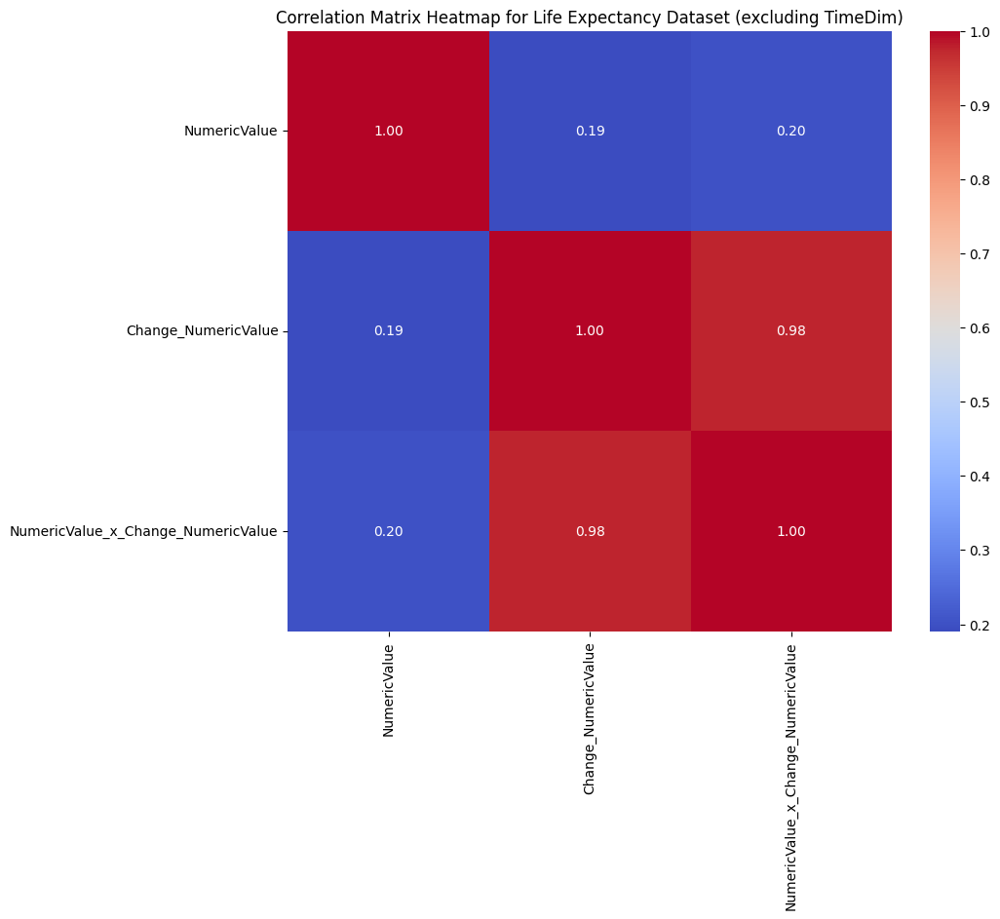


Correlation Matrix for Infant Mortality dataset (excluding TimeDim):
                                    NumericValue  Change_NumericValue  \
NumericValue                             1.00000             0.093380   
Change_NumericValue                      0.09338             1.000000   
NumericValue_x_Change_NumericValue       0.26259             0.852659   

                                    NumericValue_x_Change_NumericValue  
NumericValue                                                  0.262590  
Change_NumericValue                                           0.852659  
NumericValue_x_Change_NumericValue                            1.000000  


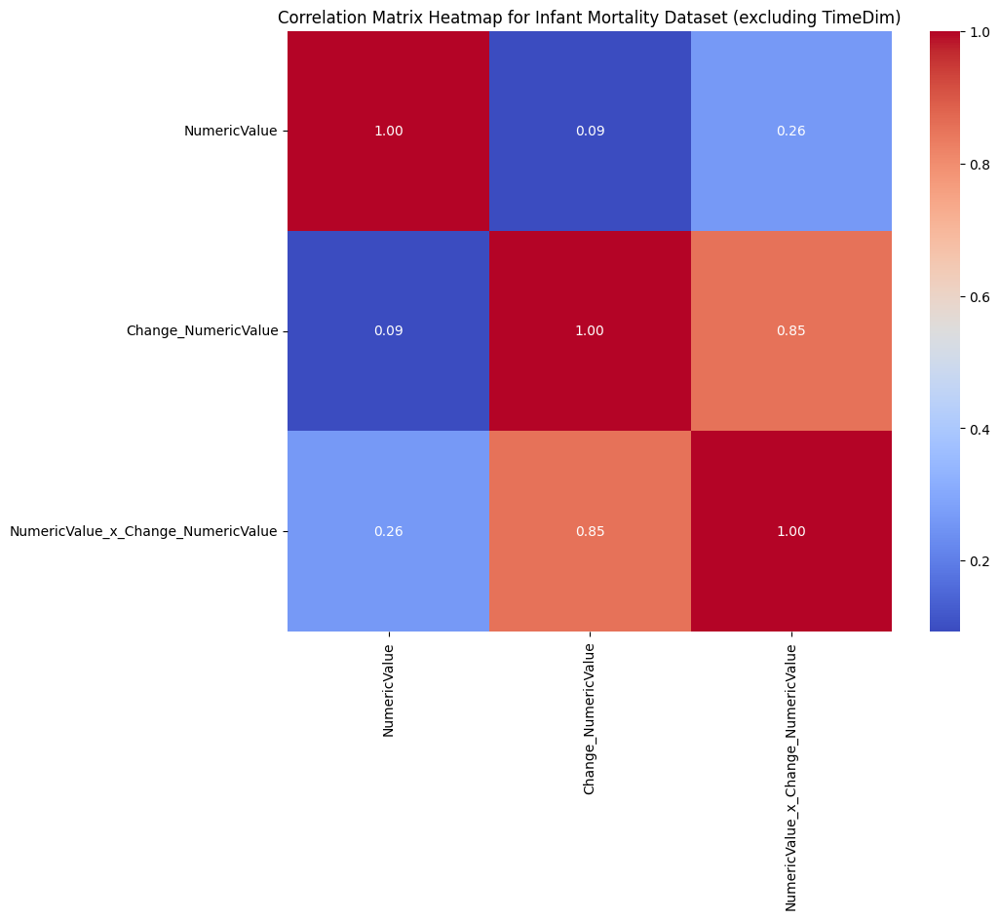


Correlation Matrix for Obesity dataset (excluding TimeDim):
                                    NumericValue  Change_NumericValue  \
NumericValue                            1.000000             0.230627   
Change_NumericValue                     0.230627             1.000000   
NumericValue_x_Change_NumericValue      0.265068             0.860209   

                                    NumericValue_x_Change_NumericValue  
NumericValue                                                  0.265068  
Change_NumericValue                                           0.860209  
NumericValue_x_Change_NumericValue                            1.000000  


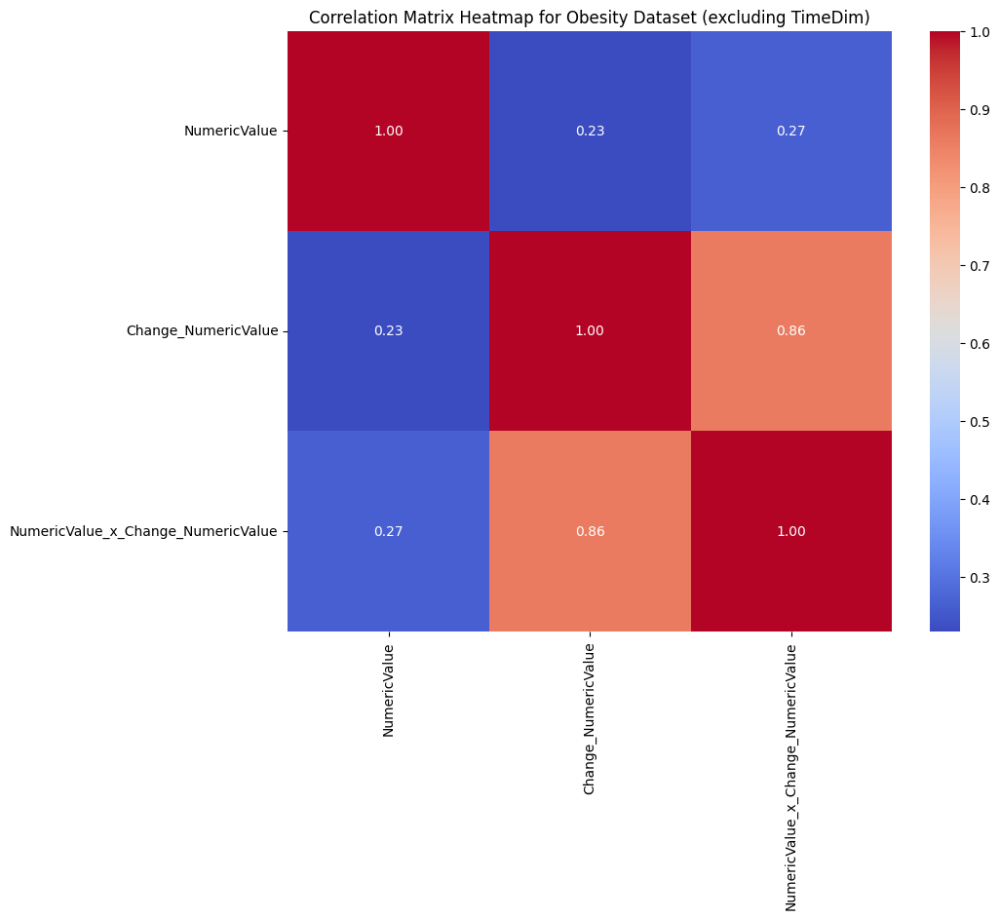


Correlation Matrix for Hypertension dataset (excluding TimeDim):
                                    NumericValue  Change_NumericValue  \
NumericValue                            1.000000             0.249214   
Change_NumericValue                     0.249214             1.000000   
NumericValue_x_Change_NumericValue      0.322467             0.881926   

                                    NumericValue_x_Change_NumericValue  
NumericValue                                                  0.322467  
Change_NumericValue                                           0.881926  
NumericValue_x_Change_NumericValue                            1.000000  


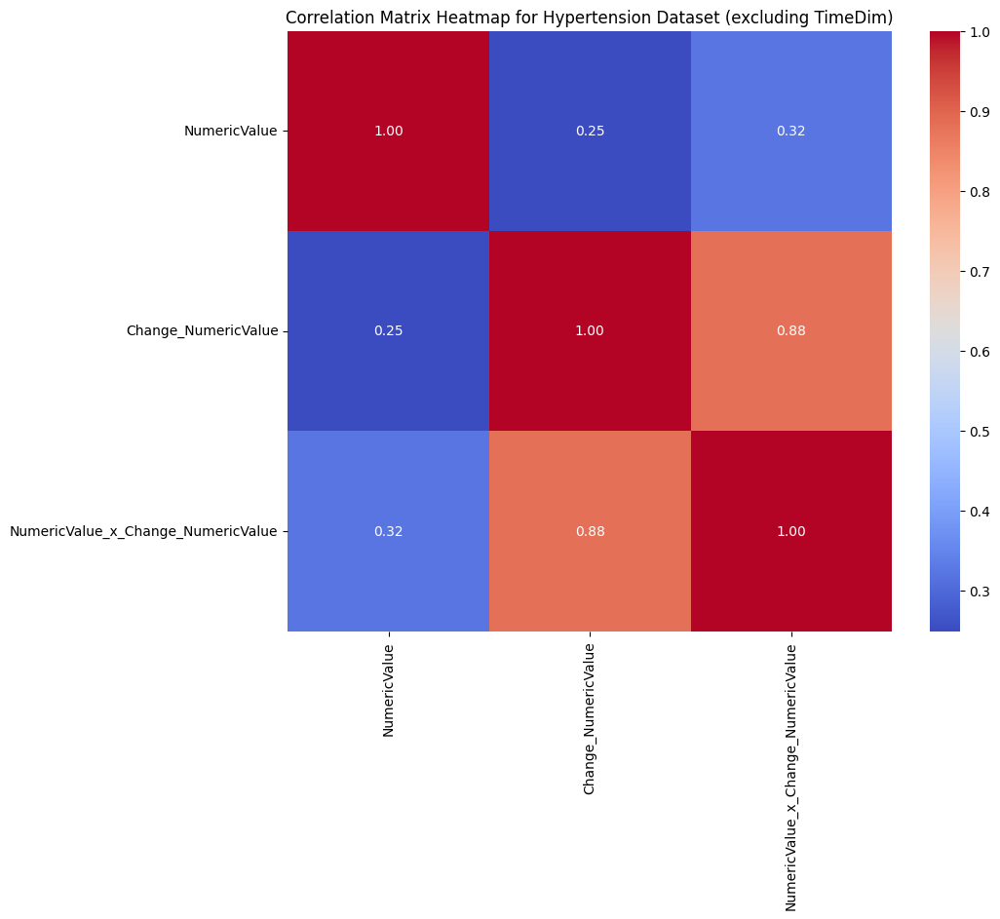


Correlation Matrix for Water Access dataset (excluding TimeDim):
                                    NumericValue  Change_NumericValue  \
NumericValue                            1.000000             0.396698   
Change_NumericValue                     0.396698             1.000000   
NumericValue_x_Change_NumericValue      0.245876             0.937409   

                                    NumericValue_x_Change_NumericValue  
NumericValue                                                  0.245876  
Change_NumericValue                                           0.937409  
NumericValue_x_Change_NumericValue                            1.000000  


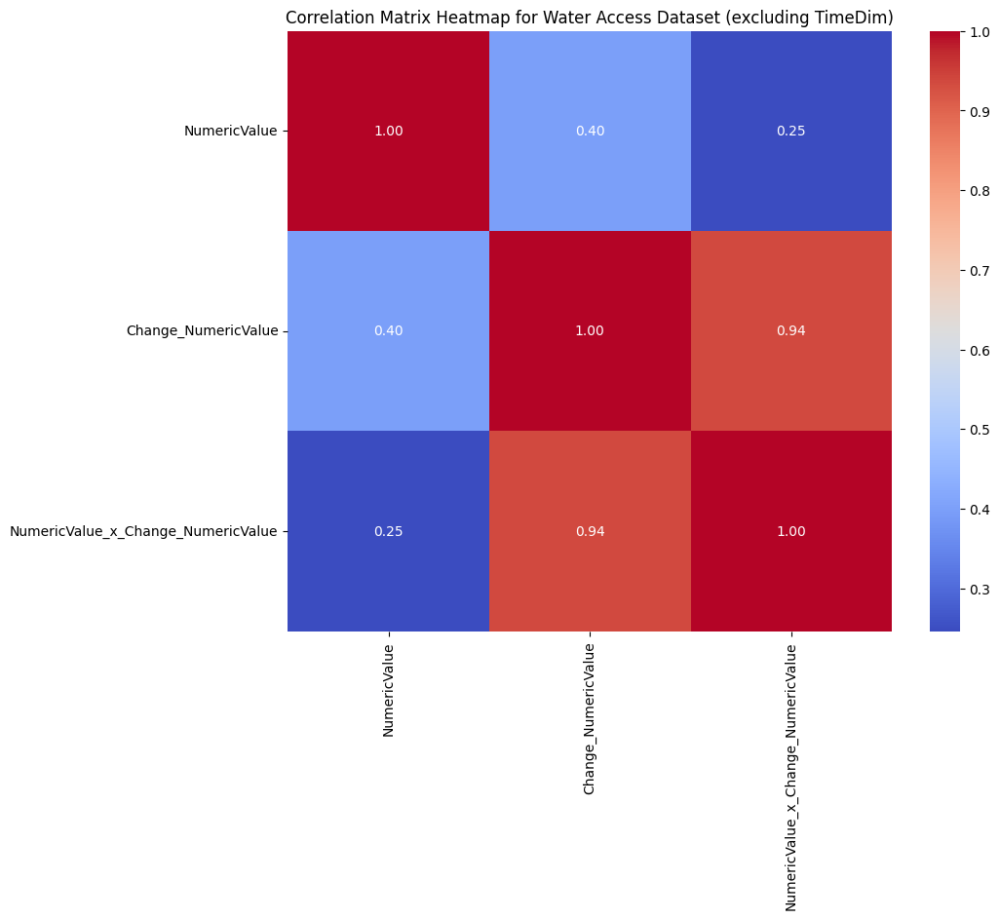


Correlation Matrix for Sanitation Access dataset (excluding TimeDim):
                                    NumericValue  Change_NumericValue  \
NumericValue                            1.000000             0.145109   
Change_NumericValue                     0.145109             1.000000   
NumericValue_x_Change_NumericValue      0.119694             0.881523   

                                    NumericValue_x_Change_NumericValue  
NumericValue                                                  0.119694  
Change_NumericValue                                           0.881523  
NumericValue_x_Change_NumericValue                            1.000000  


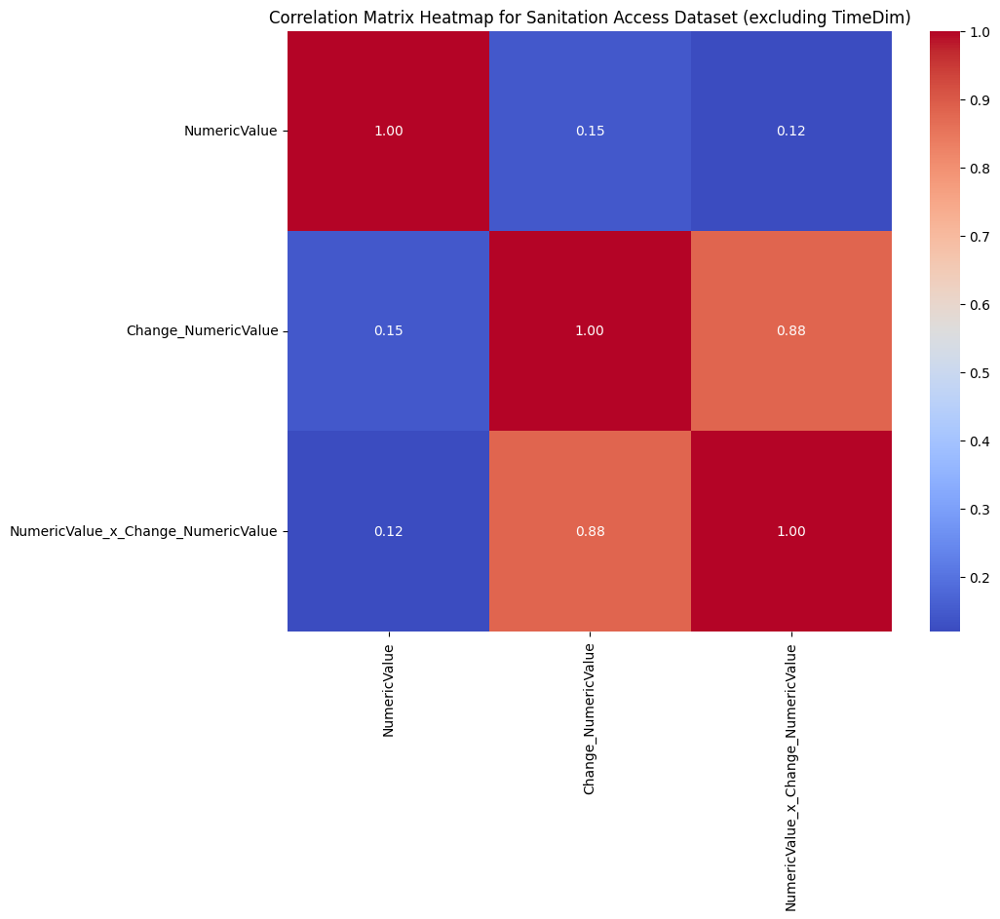

In [22]:
# Plot a correlation matrix for each dataset
# Recalculate correlation matrix excluding 'TimeDim'
for name, df in cleaned_datasets.items():
    numeric_df = df.select_dtypes(include=[np.number]).drop(columns=['TimeDim'], errors='ignore')
    
    # Calculate the correlation matrix
    correlation_matrix = numeric_df.corr()
    print(f"\nCorrelation Matrix for {name} dataset (excluding TimeDim):")
    print(correlation_matrix)
    
    # Heatmap of the correlation matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title(f'Correlation Matrix Heatmap for {name} Dataset (excluding TimeDim)')
    plt.show()

In [23]:
# Check Before merge if there
# Check if 'Country' column exists in each dataset before merging
for name, df in cleaned_datasets.items():
    if 'Country' not in df.columns:
        print(f"Warning: 'Country' column is missing in the {name} dataset.")

### 5. Merge Datasets

In [25]:
# Merge Data

# Merge the datasets on 'SpatialDim' (Country) and 'TimeDim' (Year)
merged_df = pd.DataFrame()

# Use the first dataset as the base
base_dataset = cleaned_datasets['Life Expectancy']

# Ensure that 'Country' and 'TimeDim' are present in all datasets before merging
for name, df in cleaned_datasets.items():
    if name != 'Life Expectancy':  # Skip the base dataset
        if 'Country' in df.columns and 'TimeDim' in df.columns:
            base_dataset = pd.merge(base_dataset, df, on=['Country', 'TimeDim'], how='outer', suffixes=('', f'_{name.replace(" ", "_")}'))
        else:
            print(f"Warning: '{name}' does not contain 'Country' or 'TimeDim' columns. Skipping this dataset.")
            continue

# Set the merged dataset as merged_df
merged_df = base_dataset

# Ensure that 'Country' and 'TimeDim' are still present in the merged DataFrame
if 'Country' not in merged_df.columns or 'TimeDim' not in merged_df.columns:
    print("Error: 'Country' or 'TimeDim' columns are missing after merging.")
else:
    print("Merging was successful.")

# Display the first few rows of the merged dataset
print("First few rows of the merged dataset:")
print(merged_df.head())

Merging was successful.
First few rows of the merged dataset:
  SpatialDimType Country              Continent  TimeDim  NumericValue  \
0        COUNTRY     AFG  Eastern Mediterranean     2000      0.327954   
1        COUNTRY     AFG  Eastern Mediterranean     2000      0.327954   
2        COUNTRY     AFG  Eastern Mediterranean     2000      0.327954   
3        COUNTRY     AFG  Eastern Mediterranean     2000      0.327954   
4        COUNTRY     AFG  Eastern Mediterranean     2000      0.327954   

   Change_NumericValue LifeExpectancyCategory  \
0             0.421836                    Low   
1             0.421836                    Low   
2             0.421836                    Low   
3             0.421836                    Low   
4             0.421836                    Low   

   NumericValue_x_Change_NumericValue SpatialDimType_Infant_Mortality  \
0                            0.367019                         COUNTRY   
1                            0.367019               

In [26]:
# Clean

# Deduplicate rows based on 'Country' and 'TimeDim'
merged_df = merged_df.drop_duplicates(subset=['Country', 'TimeDim'])

# Drop unnecessary columns after merging
columns_to_remove = [
    'SpatialDimType_Infant_Mortality',
    'Continent_Infant_Mortality',
    'SpatialDimType_Obesity',
    'Continent_Obesity',
    'SpatialDimType_Water_Access',
    'Continent_Water_Access',
    'SpatialDimType_Sanitation_Access',
    'Continent_Sanitation_Access',
    'SpatialDimType_Hypertension',
    'Continent_Hypertension'
]

existing_columns_to_remove = [col for col in columns_to_remove if col in merged_df.columns]
merged_df.drop(columns=existing_columns_to_remove, inplace=True)

# Rename columns for clarity (if not already done)
columns_to_rename = {
    'NumericValue': 'Life_Expectancy',
    'NumericValue_Infant_Mortality': 'Infant_Mortality',
    'NumericValue_Obesity': 'Obesity',
    'NumericValue_Hypertension': 'Hypertension',
    'NumericValue_Water_Access': 'Water_Access',
    'NumericValue_Sanitation_Access': 'Sanitation_Access'
}
merged_df.rename(columns=columns_to_rename, inplace=True)

# Handle missing using forward fill and then backward fill as a fallback
for column in merged_df.columns:
    merged_df[column] = merged_df[column].fillna(method='ffill').fillna(method='bfill')

# After filling, check for any remaining missing values
missing_values_after_filling = merged_df.isnull().sum()
print("Missing values per column after filling:")
print(missing_values_after_filling[missing_values_after_filling > 0])
# Ensure the DataFrame is not a view, and handle operations in place correctly using .loc[]
merged_df = merged_df.copy()

# Apply changes using .loc[] to avoid SettingWithCopyWarning
for column in ['Life_Expectancy', 'Infant_Mortality', 'Obesity', 'Hypertension', 'Water_Access', 'Sanitation_Access']:
    if column in merged_df.columns:
        merged_df.loc[:, column] = merged_df[column].interpolate(method='linear')

# Display the cleaned dataset
print("First few rows of the cleaned dataset:")
print(merged_df.head())


Missing values per column after filling:
Series([], dtype: int64)
First few rows of the cleaned dataset:
    SpatialDimType Country              Continent  TimeDim  Life_Expectancy  \
0          COUNTRY     AFG  Eastern Mediterranean     2000         0.327954   
81         COUNTRY     AFG  Eastern Mediterranean     2001         0.340957   
162        COUNTRY     AFG  Eastern Mediterranean     2002         0.360886   
243        COUNTRY     AFG  Eastern Mediterranean     2003         0.386901   
324        COUNTRY     AFG  Eastern Mediterranean     2004         0.388617   

     Change_NumericValue LifeExpectancyCategory  \
0               0.421836                    Low   
81              0.423885                    Low   
162             0.430139                    Low   
243             0.441684                    Low   
324             0.430814                    Low   

     NumericValue_x_Change_NumericValue  Infant_Mortality  \
0                              0.367019          0.1

C:\Users\milto\AppData\Local\Temp\ipykernel_14148\655271880.py:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\milto\AppData\Local\Temp\ipykernel_14148\655271880.py:32: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\milto\AppData\Local\Temp\ipykernel_14148\655271880.py:38: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\milto\AppData\Local\Temp\ipykernel_14148\655271880.py:38: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer

In [27]:
# Ensure 'Country' and 'Continent' are included in merged_df_cleaned
numeric_columns = merged_df.select_dtypes(include=[float, int]).columns
merged_df_cleaned = merged_df[['Country', 'Continent'] + numeric_columns.tolist()]

# Exclude 'TimeDim' from VIF calculation and PCA
X = merged_df_cleaned[['Infant_Mortality', 'Obesity', 'Hypertension', 'Water_Access', 'Sanitation_Access']]

# Include Life Expectancy in the correlation matrix and analysis
X_with_life_expectancy = merged_df_cleaned[['Life_Expectancy', 'Infant_Mortality', 'Obesity', 'Hypertension', 'Water_Access', 'Sanitation_Access']]

# Check if Country' and 'Continent' is now in merged_df_cleaned
print("Column names in merged_df_cleaned right before comparison:")
print(merged_df_cleaned.columns)

Column names in merged_df_cleaned right before comparison:
Index(['Country', 'Continent', 'TimeDim', 'Life_Expectancy',
       'Change_NumericValue', 'NumericValue_x_Change_NumericValue',
       'Infant_Mortality', 'Change_NumericValue_Infant_Mortality',
       'NumericValue_x_Change_NumericValue_Infant_Mortality', 'Obesity',
       'Change_NumericValue_Obesity',
       'NumericValue_x_Change_NumericValue_Obesity', 'Hypertension',
       'Change_NumericValue_Hypertension',
       'NumericValue_x_Change_NumericValue_Hypertension', 'Water_Access',
       'Change_NumericValue_Water_Access',
       'NumericValue_x_Change_NumericValue_Water_Access', 'Sanitation_Access',
       'Change_NumericValue_Sanitation_Access',
       'NumericValue_x_Change_NumericValue_Sanitation_Access'],
      dtype='object')


VIF Data:
             feature       VIF
0   Infant_Mortality  1.471825
1            Obesity  3.149828
2       Hypertension  3.273344
3       Water_Access  6.844042
4  Sanitation_Access  5.201914
Explained variance by each component: [0.44724686 0.15625172 0.14847129 0.14296099 0.10506914]
Correlation Matrix:
                   Life_Expectancy  Infant_Mortality   Obesity  Hypertension  \
Life_Expectancy           1.000000         -0.433333  0.213216      0.585877   
Infant_Mortality         -0.433333          1.000000 -0.244659     -0.312207   
Obesity                   0.213216         -0.244659  1.000000      0.374047   
Hypertension              0.585877         -0.312207  0.374047      1.000000   
Water_Access              0.300822         -0.286257  0.263264      0.291350   
Sanitation_Access         0.521890         -0.272653  0.261819      0.441859   

                   Water_Access  Sanitation_Access  
Life_Expectancy        0.300822           0.521890  
Infant_Mortality      

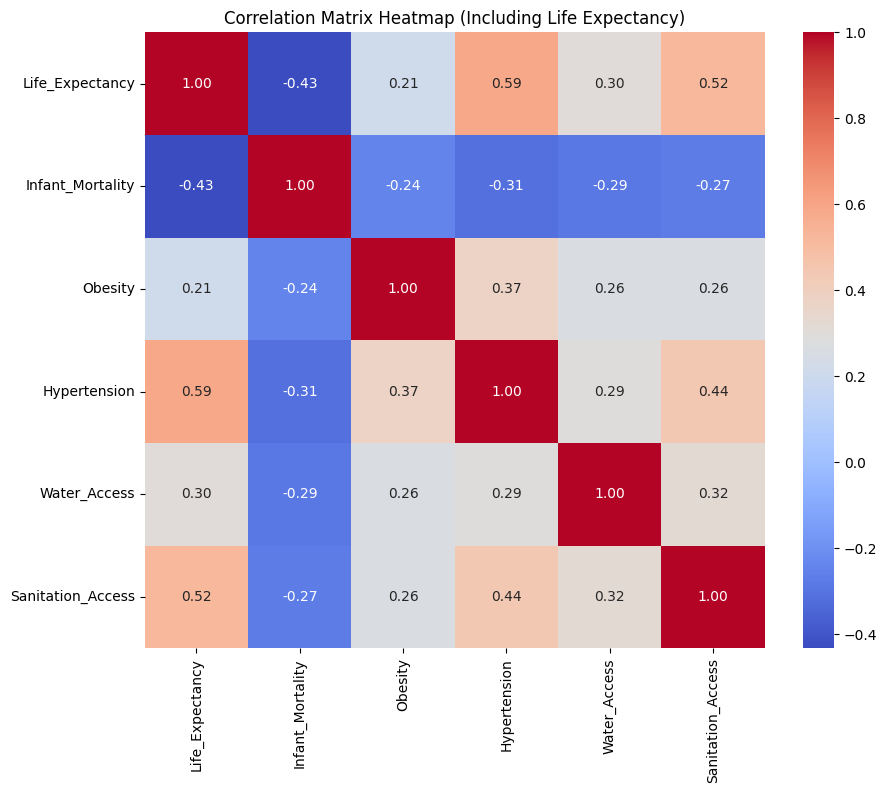

In [28]:
# Calculate VIF for the selected features
vif_data = calculate_vif(X)
print("VIF Data:")
print(vif_data)

# Perform PCA to reduce dimensionality
X_scaled = StandardScaler().fit_transform(X)
pca = PCA()
principal_components = pca.fit_transform(X_scaled)

# Explained variance by each component
explained_variance = pca.explained_variance_ratio_
print("Explained variance by each component:", explained_variance)

# Correlation matrix including Life Expectancy
correlation_matrix = X_with_life_expectancy.corr()
print("Correlation Matrix:")
print(correlation_matrix)

# Heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix Heatmap (Including Life Expectancy)')
plt.show()

### 6. Analyzing and Comparing Data

C:\Users\milto\AppData\Local\Temp\ipykernel_14148\2224367591.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Correlation Matrix (Excluding TimeDim)


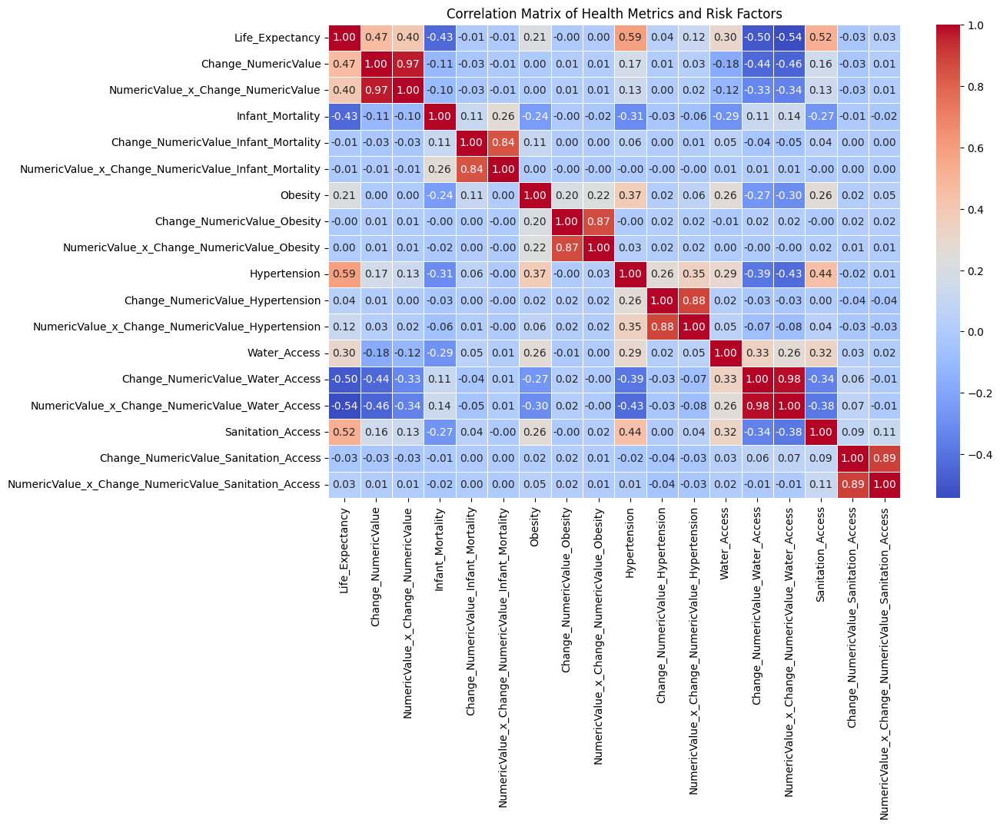

Global Benchmarks:
Life_Expectancy                                         0.556474
Change_NumericValue                                     0.393438
NumericValue_x_Change_NumericValue                      0.344449
Infant_Mortality                                        0.037520
Change_NumericValue_Infant_Mortality                    0.584609
NumericValue_x_Change_NumericValue_Infant_Mortality     0.286798
Obesity                                                 0.210240
Change_NumericValue_Obesity                             0.498154
NumericValue_x_Change_NumericValue_Obesity              0.423560
Hypertension                                            0.171963
Change_NumericValue_Hypertension                        0.507378
NumericValue_x_Change_NumericValue_Hypertension         0.375747
Water_Access                                            0.877805
Change_NumericValue_Water_Access                        0.618763
NumericValue_x_Change_NumericValue_Water_Access         0.478982
Sanita

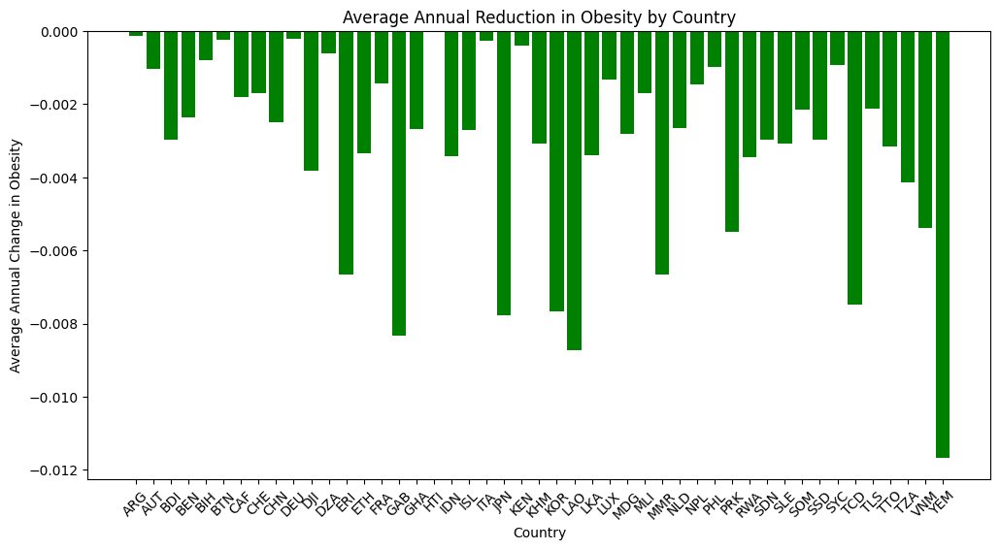

Countries/Regions with a Reduction in Hypertension:
    Country  Annual_Change
0       AFG      -0.005479
1       AGO      -0.000332
2       ALB      -0.000249
119     MMR      -0.000830
186     TZA      -0.001411
190     USA      -0.003404
191     UZB      -0.013199
192     VCT      -0.003653
193     VEN      -0.002698
194     VNM      -0.001660
199     ZMB      -0.000498


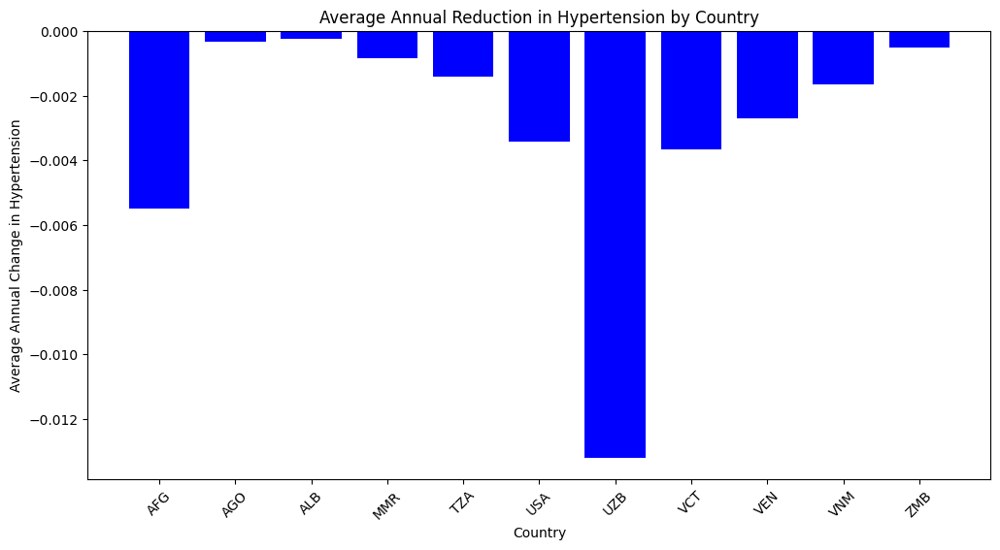

<Figure size 1200x800 with 0 Axes>

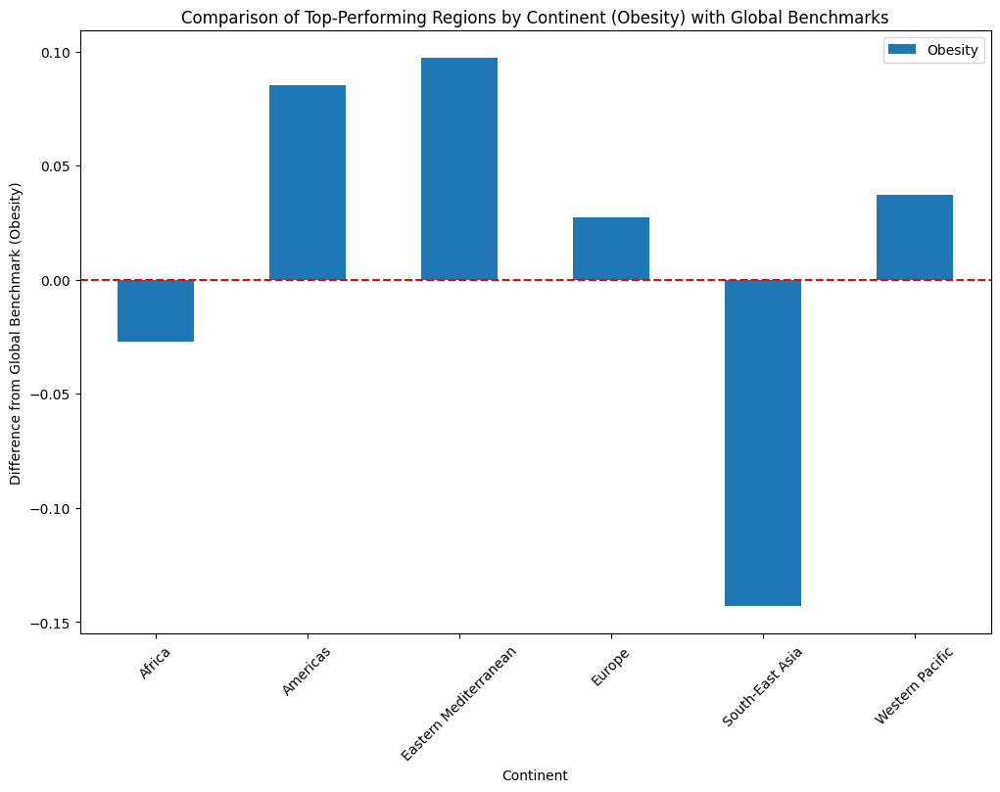

<Figure size 1200x800 with 0 Axes>

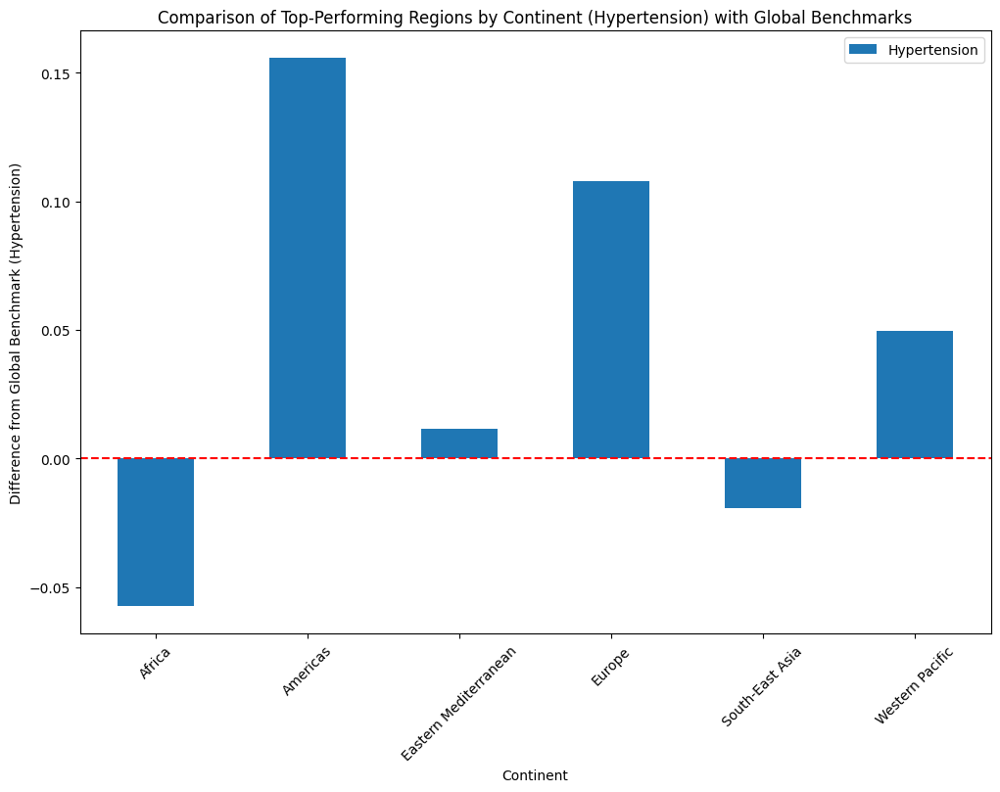

<Figure size 1200x800 with 0 Axes>

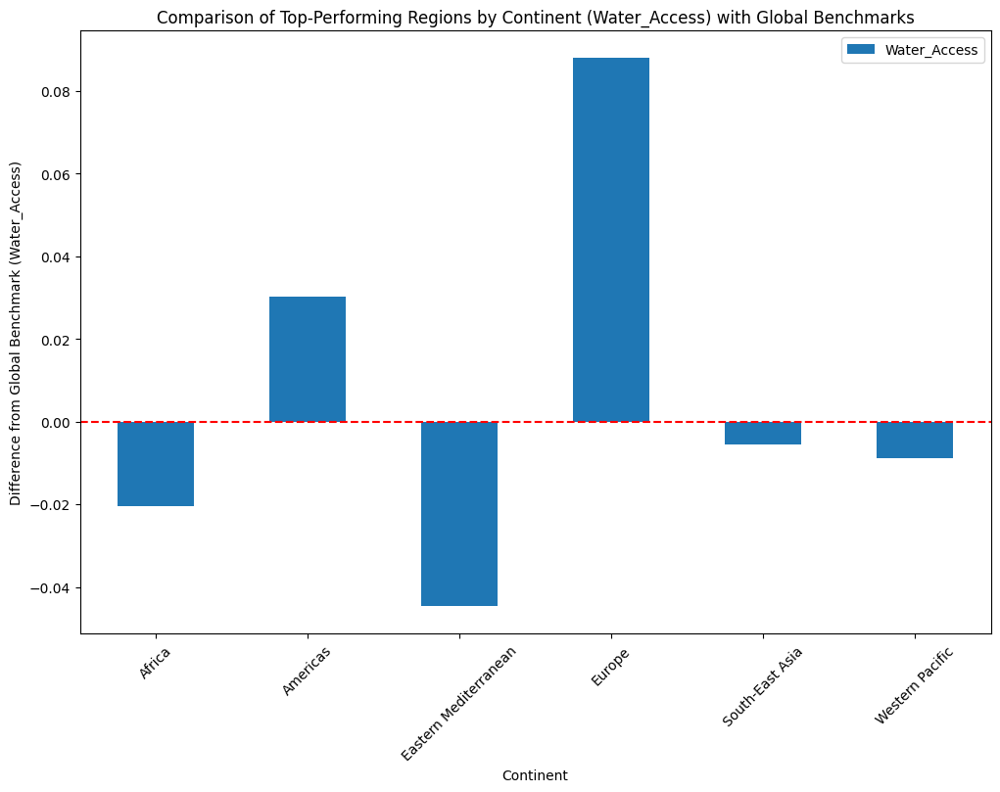

<Figure size 1200x800 with 0 Axes>

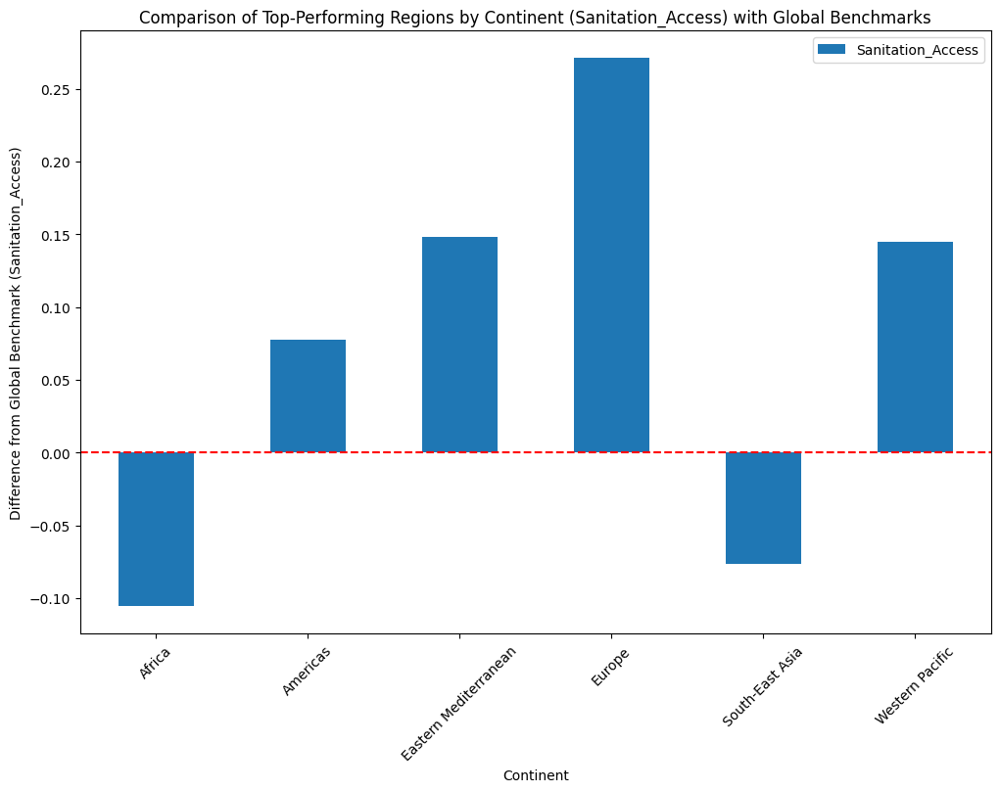

In [30]:
# Rename the column as required
merged_df_cleaned.rename(columns={'NumericValue_Sanitation_Access': 'Sanitation_Access'}, inplace=True)

# Function to compute and plot the correlation matrix, excluding 'TimeDim'
def plot_correlation_matrix(df):
    plt.figure(figsize=(12, 8))
    
    # Select only numeric columns for correlation, excluding 'TimeDim'
    numeric_df = df.select_dtypes(include=['float64', 'int64']).drop(columns=['TimeDim'])
    
    # Compute the correlation matrix
    corr_matrix = numeric_df.corr()
    
    # Plot the heatmap
    sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
    plt.title("Correlation Matrix of Health Metrics and Risk Factors")
    plt.show()

# Display correlation matrix heatmap
print("### Correlation Matrix (Excluding TimeDim)")
plot_correlation_matrix(merged_df_cleaned)

# Filter to include only numeric columns (excluding 'TimeDim')
numeric_columns = merged_df_cleaned.select_dtypes(include=[np.number]).drop(columns=['TimeDim']).columns.tolist()

# Calculate Global Benchmarks (mean) for numeric columns only (excluding 'TimeDim')
global_benchmarks = merged_df_cleaned[numeric_columns].mean()
print("Global Benchmarks:")
print(global_benchmarks)

# Function to perform comparisons by Country or Continent
def compare_top_performers(df, group_col, numeric_columns, global_benchmarks, title_suffix):
    # Ensure the group_col exists in the DataFrame
    if group_col not in df.columns:
        raise KeyError(f"'{group_col}' is not a valid column name in the DataFrame.")
    
    filtered_df = df.dropna(subset=['Life_Expectancy', group_col])
    
    # Group by the specified column and select the rows with the highest Life_Expectancy
    top_performers = filtered_df.loc[filtered_df.groupby(group_col)['Life_Expectancy'].idxmax()]
    
    # Compare numeric values from top performers with global benchmarks
    comparison_df = top_performers.set_index(group_col)[numeric_columns].subtract(global_benchmarks)
    
    # Visualize the Comparisons
    plt.figure(figsize=(12, 8))
    comparison_df.plot(kind='bar', figsize=(12, 8))
    plt.title(f'Comparison of Top-Performing {title_suffix} with Global Benchmarks')
    plt.ylabel('Difference from Global Benchmark')
    plt.xlabel(group_col)
    plt.axhline(0, color='red', linestyle='--')
    plt.xticks(rotation=45)
    plt.show()

# Function to calculate annual improvement/reduction for a given metric
def calculate_annual_change(df, group_col, year_col, metric_col):
    df_sorted = df.sort_values(by=[group_col, year_col])
    df_sorted['Annual_Change'] = df_sorted.groupby(group_col)[metric_col].diff().fillna(0)
    return df_sorted

# Apply the function to calculate annual improvement/reduction for obesity and hypertension
year_column = 'TimeDim'  # 'TimeDim' represents the year in your dataset
for metric in ['Obesity', 'Hypertension']:
    change_df = calculate_annual_change(merged_df_cleaned, 'Country', year_column, metric)
    
    # Calculate Average Annual Change for each country
    average_change = change_df.groupby('Country')['Annual_Change'].mean().reset_index()
    
    # Identify countries with consistent reductions (negative values)
    reduced_countries = average_change[average_change['Annual_Change'] < 0]
    
    # Display results
    print(f"Countries/Regions with a Reduction in {metric}:")
    print(reduced_countries)
    
    # Visualize the reductions
    plt.figure(figsize=(12, 6))
    plt.bar(reduced_countries['Country'], reduced_countries['Annual_Change'], color='green' if metric == 'Obesity' else 'blue')
    plt.title(f'Average Annual Reduction in {metric} by Country')
    plt.xlabel('Country')
    plt.ylabel(f'Average Annual Change in {metric}')
    plt.xticks(rotation=45)
    plt.show()

# Comparison by ParentLocation with Global Benchmarks for Each Risk Factor
risk_factors = ['Obesity', 'Hypertension', 'Water_Access', 'Sanitation_Access']

for risk_factor in risk_factors:
    plt.figure(figsize=(12, 8))
    
    # Compare the specific risk factor against global benchmarks
    comparison_df = merged_df_cleaned.groupby('Continent')[[risk_factor]].mean().subtract(global_benchmarks[risk_factor])
    
    # Plot the comparison
    comparison_df.plot(kind='bar', figsize=(12, 8))
    plt.title(f'Comparison of Top-Performing Regions by Continent ({risk_factor}) with Global Benchmarks')
    plt.ylabel(f'Difference from Global Benchmark ({risk_factor})')
    plt.xlabel('Continent')
    plt.axhline(0, color='red', linestyle='--')
    plt.xticks(rotation=45)
    plt.show()

<Figure size 1200x800 with 0 Axes>

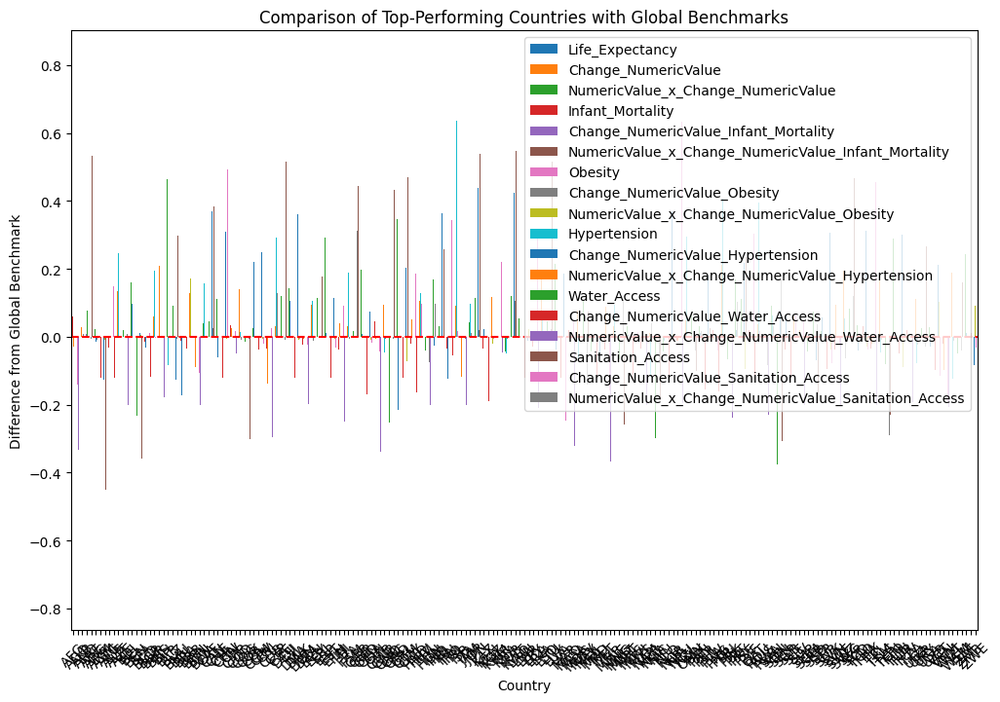

In [31]:
# Perform the comparison by Country
compare_top_performers(merged_df_cleaned, 'Country', numeric_columns, global_benchmarks, 'Countries')

<Figure size 1200x800 with 0 Axes>

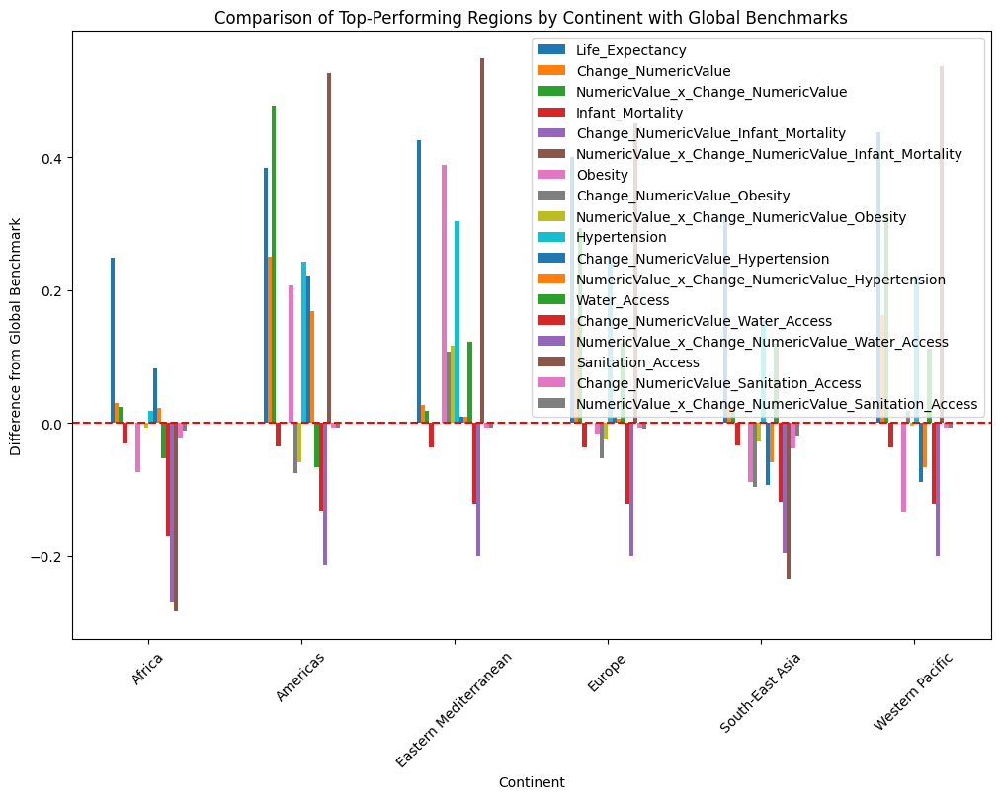

In [32]:
# 'Continent' is a valid column in the dataset
compare_top_performers(merged_df_cleaned, 'Continent', numeric_columns, global_benchmarks, 'Regions by Continent')

<Figure size 1200x800 with 0 Axes>

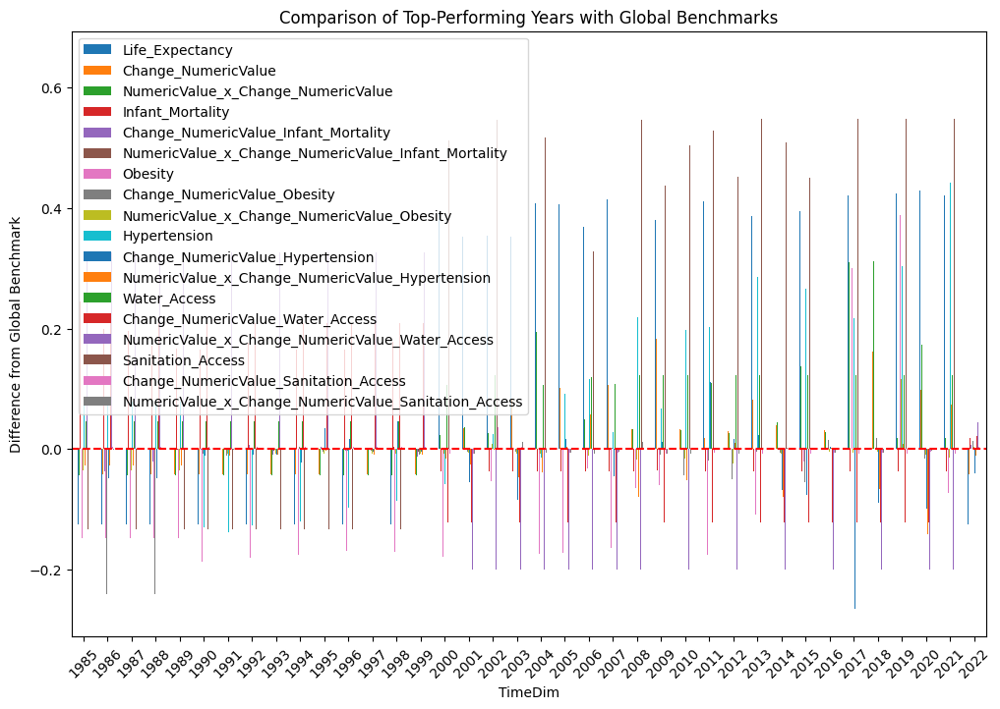

In [33]:
# TimeDim' is meaningful for analysis
compare_top_performers(merged_df_cleaned, 'TimeDim', numeric_columns, global_benchmarks, 'Years')

In [34]:
print(merged_df_cleaned.head())

    Country              Continent  TimeDim  Life_Expectancy  \
0       AFG  Eastern Mediterranean     2000         0.327954   
81      AFG  Eastern Mediterranean     2001         0.340957   
162     AFG  Eastern Mediterranean     2002         0.360886   
243     AFG  Eastern Mediterranean     2003         0.386901   
324     AFG  Eastern Mediterranean     2004         0.388617   

     Change_NumericValue  NumericValue_x_Change_NumericValue  \
0               0.421836                            0.367019   
81              0.423885                            0.368545   
162             0.430139                            0.373563   
243             0.441684                            0.383789   
324             0.430814                            0.374638   

     Infant_Mortality  Change_NumericValue_Infant_Mortality  \
0            0.198573                              0.583016   
81           0.187839                              0.575928   
162          0.188411                    

In [35]:
print(merged_df_cleaned.info())

<class 'pandas.core.frame.DataFrame'>
Index: 7538 entries, 0 to 613834
Data columns (total 21 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   Country                                               7538 non-null   object 
 1   Continent                                             7538 non-null   object 
 2   TimeDim                                               7538 non-null   int64  
 3   Life_Expectancy                                       7538 non-null   float64
 4   Change_NumericValue                                   7538 non-null   float64
 5   NumericValue_x_Change_NumericValue                    7538 non-null   float64
 6   Infant_Mortality                                      7538 non-null   float64
 7   Change_NumericValue_Infant_Mortality                  7538 non-null   float64
 8   NumericValue_x_Change_NumericValue_Infant_Mortality   7538 no

In [36]:
print(merged_df_cleaned.describe())

           TimeDim  Life_Expectancy  Change_NumericValue  \
count  7538.000000      7538.000000          7538.000000   
mean   2003.698992         0.556474             0.393438   
std      10.893760         0.173419             0.067254   
min    1985.000000         0.083823             0.028081   
25%    1994.000000         0.430984             0.351057   
50%    2004.000000         0.430984             0.351057   
75%    2013.000000         0.711964             0.429071   
max    2022.000000         0.993787             1.000000   

       NumericValue_x_Change_NumericValue  Infant_Mortality  \
count                         7538.000000       7538.000000   
mean                             0.344449          0.037520   
std                              0.093014          0.055628   
min                              0.000000          0.000000   
25%                              0.300400          0.003246   
50%                              0.300400          0.013105   
75%               